In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from celluloid import Camera
from matplotlib import cm
import math

In [2]:
cd './Experiment_data/realpilot_10302023'

/Users/weinan/Documents/GitHub/oTreeProjects/TimingGames/Experiment_data/realpilot_10302023


In [3]:
# cd './Documents/GitHub/oTreeProjects/TimingGames/Experiment_data/realpilot_10302023/timing_game_2023-10-30_cus.csv'

In [3]:
data = pd.read_csv('timing_game_2023-10-30_cus.csv')
df_copy = pd.DataFrame(data)
df_copy.shape

(38292, 24)

In [13]:
# df_copy = df_copy[df_copy['session'] == 'fiy4zmu5'] #only select real pilot session data
# df_copy.columns

Index(['session', 'subperiod', 'period_length', 'xmax', 'xmin', 'ymax', 'ymin',
       'lambda', 'gamma', 'rho', 'freeze_period', 'multiplier', 'participant',
       'round_number', 'id_in_group', 'seconds', 'strategy', 'payoff',
       'multiplied_payoff', 'move', 'remaining_freeze_period',
       'if_freeze_next', 'if_freeze_now', 'bug'],
      dtype='object')

In [9]:
#find strange strategy values
# df = df_copy[df_copy['strategy'] > 20]
# df_copy['bug'].unique()
# df = df_copy[df_copy['bug'] ==2]
# df

,session,subperiod,period_length,xmax,xmin,ymax,ymin,lambda,gamma,rho,...,id_in_group,seconds,strategy,payoff,multiplied_payoff,move,remaining_freeze_period,if_freeze_next,if_freeze_now,bug
1204,fiy4zmu5,0.5,150,14.0,1.0,150.0,0.0,10.0,2.0,3.0,...,2,0.0,3.86,59.695274,77.603856,0,0,0,0,2.0
1205,fiy4zmu5,0.5,150,14.0,1.0,150.0,0.0,10.0,2.0,3.0,...,3,0.0,6.15,68.011385,88.414800,0,0,0,0,2.0
1207,fiy4zmu5,0.5,150,14.0,1.0,150.0,0.0,10.0,2.0,3.0,...,5,0.0,5.50,68.506102,89.057933,0,0,0,0,2.0
1208,fiy4zmu5,0.5,150,14.0,1.0,150.0,0.0,10.0,2.0,3.0,...,6,0.0,8.14,73.804607,95.945990,0,0,0,0,2.0
1209,fiy4zmu5,0.5,150,14.0,1.0,150.0,0.0,10.0,2.0,3.0,...,7,0.0,1.11,21.821664,28.368163,0,0,0,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38287,fiy4zmu5,0.5,150,18.0,4.0,150.0,0.0,10.0,3.0,2.0,...,9,151.0,9.78,101.573836,101.573836,0,2,1,1,2.0
38288,fiy4zmu5,0.5,150,18.0,4.0,150.0,0.0,10.0,3.0,2.0,...,10,151.0,9.80,102.677515,102.677515,0,3,1,1,2.0
38289,fiy4zmu5,0.5,150,18.0,4.0,150.0,0.0,10.0,3.0,2.0,...,11,151.0,9.82,104.527355,104.527355,0,0,0,0,2.0
38290,fiy4zmu5,0.5,150,18.0,4.0,150.0,0.0,10.0,3.0,2.0,...,12,151.0,9.91,105.100298,105.100298,0,0,0,0,2.0


In [5]:
#functions
def generate_landscape_coordinate(current_strategies, lam,gam,rho,xmin,xmax):
    #calculate landscape: landscape_x, landscape_y, landscape_coordinate
    landscape_x =  np.arange(xmin, xmax, 0.01)
    landscape_x = np.round(landscape_x, 2)
    landscape_positions = []
    landscape_ties = []
    for strat in landscape_x:
        below_strat = [i for i in current_strategies if i < strat]
        pos = len(below_strat) + 0.5
        landscape_positions.append(pos)

        equal_strat = [i for i in current_strategies if i == strat]
        tie = len(equal_strat)
        landscape_ties.append(tie)
    landscape_positions = np.array(landscape_positions)
    landscape_ties = np.array(landscape_ties)

    vy = []
    ux = 1 + (2 * lam * landscape_x) - (landscape_x ** 2)
    for i in range(len(landscape_x)):
        if landscape_ties[i] < 2:
            vy.append((1 - (landscape_positions[i]/len(current_strategies))/gam) * (1 + (landscape_positions[i]/len(current_strategies))/rho))
        else:
            total = 0
            for j in range(landscape_ties[i]):
                total += (1 - ((landscape_positions[i]+j)/len(current_strategies))/gam) * (1 + ((landscape_positions[i]+j)/len(current_strategies))/rho)
            total = total/landscape_ties[i]
            vy.append(total)
    vy = np.array(vy)
    landscape_y = ux * vy
#     landscape_coordinate = np.vstack((landscape_x, landscape_y)).T
    return landscape_x, landscape_y

In [6]:
#functions
def generate_landscape_coordinate(current_strategies, lam,gam,rho,xmin,xmax, multiplier,game_type):
    #calculate landscape: landscape_x, landscape_y, landscape_coordinate
    landscape_x =  np.arange(xmin, xmax, 0.01)
    landscape_x = np.round(landscape_x, 2)
    landscape_positions = []
    landscape_ties = []
    landscape_quantile = []
    for strat in landscape_x:
        below_strat = [i for i in current_strategies if i < strat]
        if game_type == 'fear':
            pos = len(below_strat)+1
        elif game_type == 'greed':
            pos = len(below_strat)
        else:
            pos = len(below_strat) + 0.5
        landscape_positions.append(pos)

        equal_strat = [i for i in current_strategies if i == strat]
        tie = len(equal_strat)
        landscape_ties.append(tie)
    landscape_positions = np.array(landscape_positions)
    landscape_ties = np.array(landscape_ties)

    vy = []
    ux = 1 + (2 * lam * landscape_x) - (landscape_x ** 2)
    for i in range(len(landscape_x)):
        if landscape_ties[i] < 2:
            vy.append((1 - (landscape_positions[i]/len(current_strategies))/gam) * (1 + (landscape_positions[i]/len(current_strategies))/rho))
            landscape_quantile.append(landscape_positions[i]/len(current_strategies))
        else:
            total = 0
            total_quantile = 0
            for j in range(landscape_ties[i]):
                total += (1 - ((landscape_positions[i]+j)/len(current_strategies))/gam) * (1 + ((landscape_positions[i]+j)/len(current_strategies))/rho)
                total_quantile += (landscape_positions[i])/len(current_strategies)
            total_quantile = total_quantile/landscape_ties[i]
            landscape_quantile.append(total_quantile)
            total = total/landscape_ties[i]
            vy.append(total)
    vy = np.array(vy)
    landscape_y = ux * vy
    multiplier_landscape_y = multiplier*ux * vy
    landscape_quantile = np.array(landscape_quantile)
    if game_type == 'fear':
        landscape_quantile = landscape_quantile - 1/len(current_strategies)
    elif game_type == 'other':
        landscape_quantile = landscape_quantile - 1/len(current_strategies)*1/2
#     landscape_coordinate = np.vstack((landscape_x, landscape_y)).T
    return landscape_x, landscape_y, multiplier_landscape_y, landscape_quantile

# def generate_quantile(current_strategies, game_type):
    
#     current_positions = []
#     current_ties = []
#     quantile = []
#     for strat in current_strategies:
#         below_strat = [i for i in current_strategies if i < strat]
#         if game_type == 'fear':
#             pos = len(below_strat) + 1
#         elif game_type == 'greed':
#             pos = len(below_strat) 
#         else:
#             pos = len(below_strat) + 0.5
#         current_positions.append(pos)

#         equal_strat = [i for i in current_strategies if i == strat]
#         tie = len(equal_strat)
#         current_ties.append(tie)
#     for i in range(len(current_strategies)):
#         if current_ties[i] == 0:
#             quantile.append(current_positions[i]/len(current_strategies))
#         else:
#             total_quantile = 0
#             for j in range(current_ties[i]):
#                 total_quantile += (current_positions[i])/len(current_strategies)
#             total_quantile = total_quantile/ties[i]
#             quantile.append(total_quantile)
#     return quantile
    

In [7]:
def generate_initial_NE_cdf(lam,gam,rho,xmin,xmax,game_type):
    num_bots =10000
    strategies = []
    if game_type == 'fear':
        cdfmin = max(0, round((lam - math.sqrt(1+lam**2) * math.sqrt(1-(16*(1+rho)*(gam-1))/((gam +3*rho)*(3*gam +rho)))),2))
        cdfmax = lam
        cdfx = np.round(np.arange(cdfmin, cdfmax, 0.01), 2)
        cdfy = gam - rho + np.sqrt((gam + rho) ** 2 - 4 * ((1 + rho) * (gam - 1) * (1 + lam ** 2))/(1 + 2 * lam * cdfx - cdfx ** 2))
        y_ind = 0
        cdfy = cdfy/2
        for i in range(num_bots):
        # y_ind is the index in the cdf to compare to
        # we increment it until it is greater than or equal to the percentage of players set so far
            if (i+1)/num_bots <= cdfy[y_ind]:
                strategies.append(cdfx[y_ind])
            else:
                while (y_ind < len(cdfy) - 1) and ((i+1)/num_bots > cdfy[y_ind]):
                    y_ind = y_ind + 1
            # there are some rounding issues when we reach the end of the cdf
            # if we reach the end (for the last few players), just use the last value
                if y_ind >= len(cdfy):
                    strategies.append(cdfx[len(cdfy)])
                else:
                    strategies.append(cdfx[y_ind])


    elif game_type == 'greed':
        cdfmin = lam
        cdfmax = lam + math.sqrt(1+lam**2)/(math.sqrt(1+16*rho*gam/((3*gam-3*rho-2)*(gam-rho+2))))
        cdfx = np.round(np.arange(cdfmin, cdfmax, 0.01), 2)
        cdfy = gam - rho - np.sqrt((gam + rho) ** 2 - 4 * gam * rho * (1 + lam ** 2) / (1 + 2 * lam * cdfx - cdfx ** 2))
        y_ind = len(cdfy) - 1
        cdfy = cdfy / 2            

        i = num_bots
        while i > 0:
            # y_ind is the index in the cdf to compare to
            # we decrement it until it is less than or equal to the percentage of players set so far
            if (i-1)/num_bots >= cdfy[y_ind]:
                strategies.append(cdfx[y_ind])
            else:
                while y_ind > 0 and (i-1)/num_bots < cdfy[y_ind]:
                    y_ind = y_ind - 1
                # there are some rounding issues when we reach the end of the cdf
                # if we reach the end (for the last few players), just use the last value
                if y_ind == 0:
                    strategies.append(cdfx[0])
                else:
                    strategies.append(cdfx[y_ind])
            i = i - 1
    strategies_cdf = np.round(np.array(strategies), 2)
    strategies_cdf.sort()
    strategies_cdf = np.insert(strategies_cdf,0,xmin)
    strategies_cdf = np.append(strategies_cdf,xmax)
    pdf = np.array([1/num_bots]*num_bots)
    cdf=np.cumsum(pdf)
    cdf = np.insert(cdf,0,0)
    cdf = np.append(cdf,1)
    
    return strategies_cdf, cdf

fear


<IPython.core.display.Javascript object>


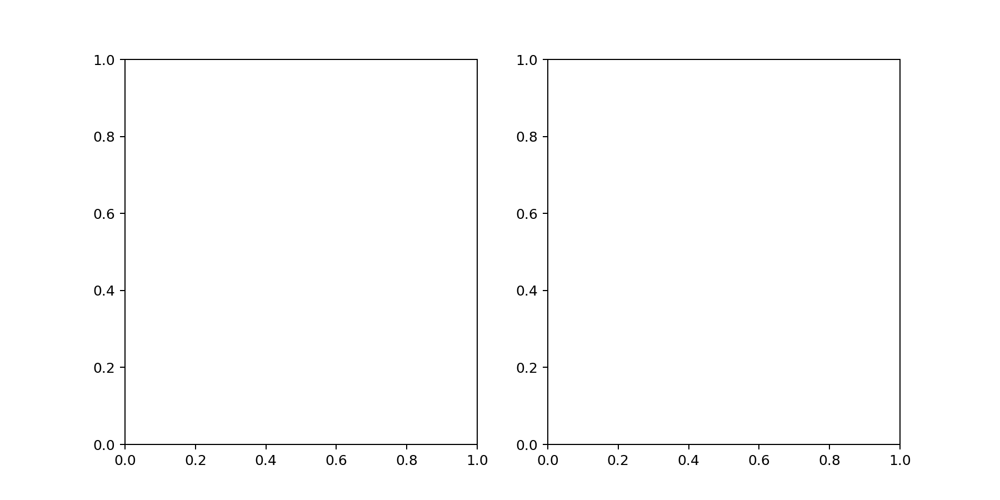

ValueError: math domain error

In [34]:
#create dynamics in selected round
selected_round_num = 4
game_type = 'greed'
df = df_copy[df_copy['session'] == 'fiy4zmu5']
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
lst_of_col = ['subperiod', 'period_length', 'xmax', 'xmin', 'ymax', 'ymin',
              'lambda', 'gamma', 'rho', 'freeze_period', 'round_number', 
              'id_in_group', 'seconds', 'strategy', 'payoff', 'multiplied_payoff', 'multiplier', 'session']
df['round_number'] = df['round_number'] - practice_num
df = df[lst_of_col]
df_round = df[df['round_number'] == selected_round_num]
subperiod = df_round.iloc[0]['subperiod']
freeze = df_round.iloc[0]['freeze_period']
lam = int(df_round.iloc[0]['lambda'])
gam = int(df_round.iloc[0]['gamma'])
rho = float(df_round.iloc[0]['rho'])
if rho>1:
    rho = int(rho)
xmax = df_round.iloc[0]['xmax']
xmin = df_round.iloc[0]['xmin']
multiplier = df_round.iloc[0]['multiplier']
# game_type = df_round.iloc[0]['game_type']
print(game_type)
%matplotlib notebook
fig = plt.figure(figsize=(10,5))
camera = Camera(fig)
gs = fig.add_gridspec(1, 2)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
plt.ion()
# df_un = df_round.seconds.unique()[:-1]
fig.show()
fig.canvas.draw()
for sec in df_round.seconds.unique()[:-1]:
    second_label = sec.copy()
    df_per_second = df_round[df_round['seconds'] == sec]
    df_per_second.sort_values(by=['id_in_group'])
    current_strategies = df_per_second['strategy'].to_list()
    strategy_payoffs = df_per_second['payoff'].to_list()
    multiplier_strategy_payoffs = df_per_second['multiplied_payoff'].to_list()
    landscape_x, landscape_y, multiplier_landscape_y, landscape_quantile = generate_landscape_coordinate(current_strategies, lam,gam,rho,xmin,xmax, multiplier, 'other')
    strategies_cdf, cdf = generate_initial_NE_cdf(lam,gam,rho,xmin,xmax,game_type)
    
#     ax1.clear()
    ax1.plot(landscape_x, multiplier_landscape_y, alpha=0.5, linewidth = '2',c='b')
#     ax1.axhline(avg_NE_payoff, color='r', linestyle='-', label='NE payoff')
    graph = ax1.scatter(current_strategies, multiplier_strategy_payoffs,c = list(range(0,len(current_strategies))), cmap='rainbow', alpha=0.4)
    ax1.set_xlabel('position')
    ax1.set_ylabel('Payoff')
#     ax1.set_title('Sec:' + str(second_label))
    ax1.set_ylim([0,150])
    ax1.grid()
#     ax1.legend()

    ax2.plot(landscape_x, landscape_quantile, linewidth = '2', label='current cdf', c='b')
    ax2.plot(strategies_cdf, cdf, label='Nash eqm cdf', c='g')
    ax2.set_xlabel('position')
    ax2.set_ylabel('Quantile')
    ax2.set_title('cdf')
    ax2.grid()
    
    plt.pause(0.01)
    ax1.text(2, 165,'Sec:' + str(second_label))
    title = 'Round ' +str(selected_round_num) + ':'+ game_type + '('+str(lam) +','+str(gam) +','+str(rho) +');'+ 'subperiod' + str(subperiod) + 'sec;freeze'+str(freeze)
    fig.suptitle(title)
#     fig.canvas.draw()
    camera.snap()
    
animation = camera.animate()
output_name = 'Dynamics_pilot2_round' +str(selected_round_num)
animation.save(output_name + '.gif') 

<IPython.core.display.Javascript object>


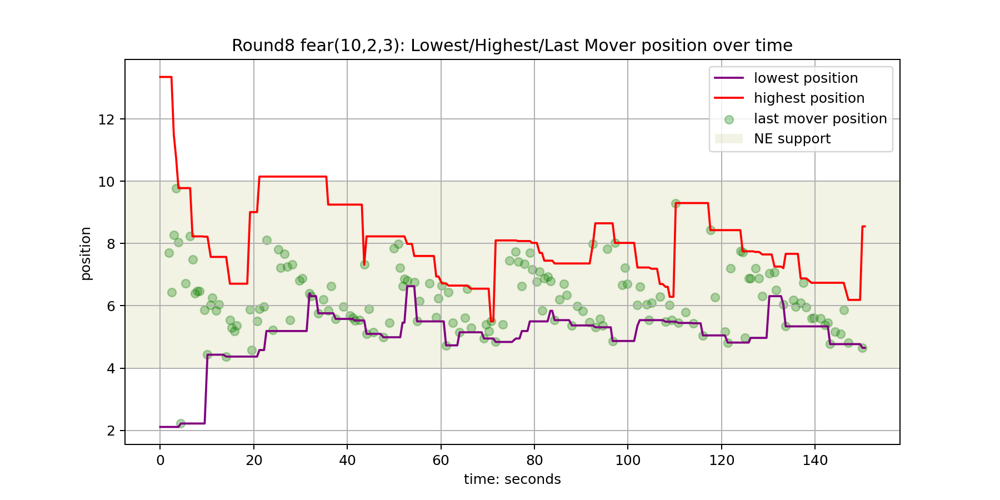

In [37]:
%matplotlib notebook
selected_round_num = 8
game_type = 'fear'
NE_support = [[10,14], [4,10]]
df = df_copy[df_copy['session'] == 'fiy4zmu5']
df = df[(df['id_in_group']!= 2)&(df['id_in_group']!= 13)&(df['id_in_group']!= 7)&(df['id_in_group']!= 10)]
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
lst_of_col = ['subperiod', 'period_length', 'xmax', 'xmin', 'ymax', 'ymin',
              'lambda', 'gamma', 'rho', 'freeze_period', 'round_number', 
              'id_in_group', 'seconds', 'strategy', 'payoff', 'move']
df['round_number'] = df['round_number'] - practice_num
df = df[lst_of_col]
df_round = df[df['round_number'] == selected_round_num]
lam = int(df_round.iloc[0]['lambda'])
gam = int(df_round.iloc[0]['gamma'])
rho = int(df_round.iloc[0]['rho'])
#use upper_bound and lower_bound
lowest_position = []
highest_position = []
last_mover_df = df_round[df_round['move']==1]
if game_type == 'greed':
    single_last_mover_df = last_mover_df.groupby(['seconds'])['strategy'].max().reset_index()
else:
    single_last_mover_df = last_mover_df.groupby(['seconds'])['strategy'].min().reset_index()
lowest_position_df = df_round.groupby(['seconds'])['strategy'].min().reset_index()
highest_position_df = df_round.groupby(['seconds'])['strategy'].max().reset_index()
plt.figure(figsize=(10,5))
plt.plot(lowest_position_df['seconds'], lowest_position_df['strategy'], color='purple', label='lowest position')
plt.plot(highest_position_df['seconds'], highest_position_df['strategy'], color='r', label='highest position')
plt.scatter(single_last_mover_df['seconds'], single_last_mover_df['strategy'], color='g', alpha=0.3, label='last mover position')
# plt.scatter(last_mover_df['seconds'], last_mover_df['strategy'], color='grey', alpha=0.2)
if game_type == 'greed':
    plt.axhspan(NE_support[0][0], NE_support[0][1], facecolor ='tan', alpha = 0.1, label='NE support')
else:
    plt.axhspan(NE_support[1][0], NE_support[1][1], facecolor ='olive', alpha = 0.1, label='NE support')
plt.xlabel('time: seconds')
plt.ylabel('position')
plt.title('Round'+str(selected_round_num) +' '+ game_type+'('+str(lam) +','+str(gam) +','+str(rho) +'): ' + 'Lowest/Highest/Last Mover position over time')
plt.legend()
plt.grid()
plt.show()
plt.savefig('clean_pilot2_round'+str(selected_round_num)+'_lowest_highest_last_position_over_time.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


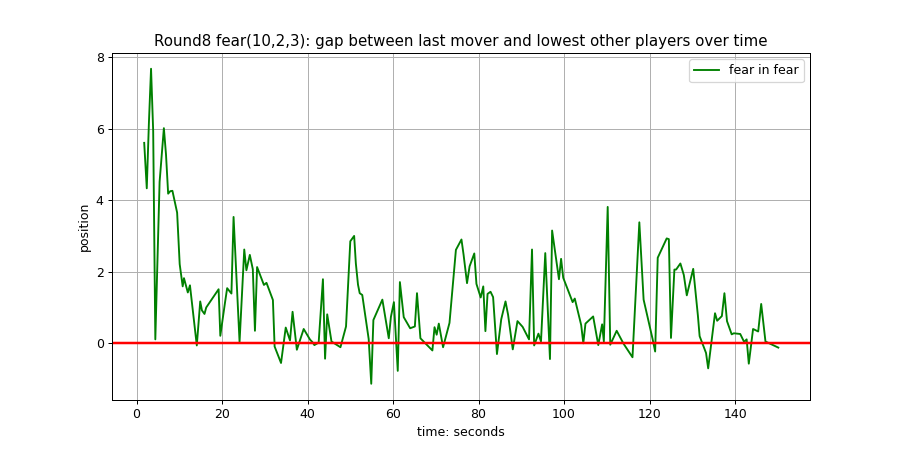

In [60]:
#gap betweeen last mover and lowest/highest at t-1
%matplotlib notebook
selected_round_num = 8
game_type = 'fear'
NE_support = [[10,14], [4,10]]
df = df_copy[df_copy['session'] == 'fiy4zmu5']
df = df[(df['id_in_group']!= 2)&(df['id_in_group']!= 13)&(df['id_in_group']!= 7)&(df['id_in_group']!= 10)]
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
lst_of_col = ['subperiod', 'period_length', 'xmax', 'xmin', 'ymax', 'ymin',
              'lambda', 'gamma', 'rho', 'freeze_period', 'round_number', 
              'id_in_group', 'seconds', 'strategy', 'payoff', 'move']
df['round_number'] = df['round_number'] - practice_num
df = df[lst_of_col]
df_round = df[df['round_number'] == selected_round_num]
lam = int(df_round.iloc[0]['lambda'])
gam = int(df_round.iloc[0]['gamma'])
rho = int(df_round.iloc[0]['rho'])
#use upper_bound and lower bound
lowest_position = []
highest_position = []
last_mover_df = df_round[df_round['move']==1]
if game_type == 'greed':
    single_last_mover_df = last_mover_df.groupby(['seconds'])['strategy'].max().reset_index()
else:
    single_last_mover_df = last_mover_df.groupby(['seconds'])['strategy'].min().reset_index()
lowest_position_df = df_round.groupby(['seconds'])['strategy'].min().reset_index()
highest_position_df = df_round.groupby(['seconds'])['strategy'].max().reset_index()
x_time = []
gap = []
for i in single_last_mover_df.seconds.unique():
    last_mover_position = single_last_mover_df.loc[single_last_mover_df['seconds'] == i, 'strategy'].values[0]
    if game_type == 'greed':
        idx = highest_position_df[lowest_position_df['seconds']== i].index.values[0]
        previous_position = highest_position_df.loc[idx-1, 'strategy']
    else:
        idx = lowest_position_df[lowest_position_df['seconds']== i].index.values[0]
        previous_position = lowest_position_df.loc[idx-1, 'strategy']
    gap_position = last_mover_position - previous_position
    x_time.append(i)
    gap.append(gap_position)

plt.figure(figsize=(10,5))
if game_type == 'greed':
    plt.plot(x_time, gap, color='b', label='gap in greed')
else:
    plt.plot(x_time, gap, color='green', label='fear in fear')
plt.axhline(y=0, color='r', linestyle='-',linewidth=2)
# plt.plot(x_time2, gap2, color='red', label='fear gap')
# plt.plot(highest_position_df['seconds'], highest_position_df['strategy'], color='r', label='highest position')
# plt.scatter(single_last_mover_df['seconds'], single_last_mover_df['strategy'], color='g', alpha=0.3, label='last mover position')
# # plt.scatter(last_mover_df['seconds'], last_mover_df['strategy'], color='grey', alpha=0.2)
# if game_type == 'greed':
#     plt.axhspan(NE_support[0][0], NE_support[0][1], facecolor ='tan', alpha = 0.1, label='NE support')
# else:
#     plt.axhspan(NE_support[1][0], NE_support[1][1], facecolor ='olive', alpha = 0.1, label='NE support')
plt.xlabel('time: seconds')
plt.ylabel('position')
plt.title('Round'+str(selected_round_num) +' '+ game_type+'('+str(lam) +','+str(gam) +','+str(rho) +'): ' + 'gap between last mover and lowest other players over time')
plt.legend()
plt.grid()
plt.show()
plt.savefig('clean_pilot2_round'+str(selected_round_num)+'_gap_over_time.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


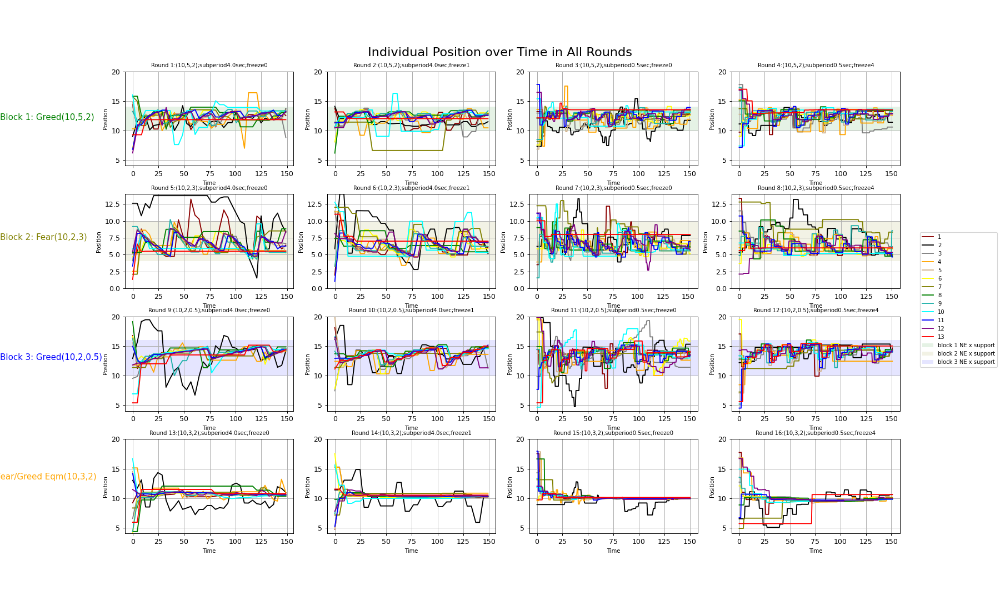

In [49]:
#generate positions over time in all rounds
#block of game (10,5,2); (10,2,3), (10,2,0.5), (10,3,2)
%matplotlib notebook
df = df_copy[df_copy['session'] == 'fiy4zmu5']
handles4 = []
labels4 = []
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
ylim = [[4,20], [0,14], [4,20], [4,20]]
# yticks = [[5,19], [0,14]]
NE_support = [[10,14], [4,10], [10,16], [8,12]]
shade_color = ['g', 'olive', 'b', 'orange']
# cmap = cm.get_cmap('Spectral')
# player_label = list(range(1,10))
NUM_COLORS = 13
plt.style.use('default')
# cm = plt.get_cmap('Spectral')
# col_lst = ['b',  'orange', 'green', 'red', 'purple', 'brown','black', 'pink', 'gray', 'olive', 'cyan', 'coral', 'tan']
col_lst = ['darkred',  'black', 'gray', 'orange', 'tan', 'yellow','olive', 'green', 'lightseagreen', 'cyan', 'blue', 'purple', 'red']

rows = 4
cols = 4
fig = plt.figure(figsize=(5*cols,3*rows)) #single 5*3
fig.subplots_adjust(hspace=0.3, wspace=0.2)
for i in range(1, rows*cols+1):
    df_round = df[df['round_number']==i]
    subperiod = df_round.iloc[0]['subperiod']
    lam = int(df_round.iloc[0]['lambda'])
    gam = int(df_round.iloc[0]['gamma'])
    rho = float(df_round.iloc[0]['rho'])
    if rho>1:
        rho = int(rho)
    freeze = int(df_round.iloc[0]['freeze_period'])
    df_round = df_round.pivot(index='seconds', columns='id_in_group', values='strategy')
    player_label = df_round.columns
    title = 'Round ' +str(i) + ':'+'('+str(lam) +','+str(gam) +','+str(rho) +');'+ 'subperiod' + str(subperiod) + 'sec;freeze'+str(freeze)
    ax = fig.add_subplot(rows, cols, i)
#     ax.set_prop_cycle(color=[cm(1.*m/NUM_COLORS) for m in range(NUM_COLORS)])
    ax.set_prop_cycle(color=col_lst)
    ax.plot(df_round, label=player_label)
    ax.set_title(title, fontsize=8)
    ax.set_xlabel('Time', fontsize=8)
    ax.set_ylabel('Position', fontsize=8)
    if (gam == 5)&(rho == 2):
        ax.set_ylim(ylim[0])
#         ax.set_yticks(yticks[0])
        ax.axhspan(NE_support[0][0], NE_support[0][1], facecolor =shade_color[0], alpha = 0.1, label='block 1 NE x support')
        handles1, labels1 = ax.get_legend_handles_labels()
    elif (gam == 2)&(rho == 3):
        ax.set_ylim(ylim[1])
#         ax.set_yticks(yticks[1])
        ax.axhspan(NE_support[1][0], NE_support[1][1], facecolor =shade_color[1], alpha = 0.1, label='block 2 NE x support')
        handles2, labels2 = ax.get_legend_handles_labels()
    elif (gam == 2)&(rho == 0.5):
        ax.set_ylim(ylim[2])
#         ax.set_yticks(yticks[1])
        ax.axhspan(NE_support[2][0], NE_support[2][1], facecolor =shade_color[2], alpha = 0.1, label='block 3 NE x support')
        handles3, labels3 = ax.get_legend_handles_labels()    
    elif (gam == 3)&(rho == 2):
        ax.set_ylim(ylim[3])
#         ax.set_yticks(yticks[1])
#         ax.axhspan(NE_support[3][0], NE_support[3][1], facecolor =shade_color[3], alpha = 0.1, label='block 4 NE x support')
        handles4, labels4 = ax.get_legend_handles_labels()   
    ax.grid()
handles4.append(handles1[-1])
labels4.append(labels1[-1])
handles4.append(handles2[-1])
labels4.append(labels2[-1])
handles4.append(handles3[-1])
labels4.append(labels3[-1])
fig.text(0, 0.8, "Block 1: Greed(10,5,2)", color=shade_color[0], fontsize=12)
fig.text(0, 0.6, "Block 2: Fear(10,2,3)", color=shade_color[1], fontsize=12)
fig.text(0, 0.4, "Block 3: Greed(10,2,0.5)", color=shade_color[2], fontsize=12)
fig.text(-0.04, 0.2, "Block 4: Fear/Greed Eqm(10,3,2)", color=shade_color[3], fontsize=12)
fig.legend(handles4, labels4, loc='center right', fontsize=8)
fig.suptitle('Individual Position over Time in All Rounds', y=0.92, fontsize=18)
plt.show()
plt.savefig('position_over_time_all.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


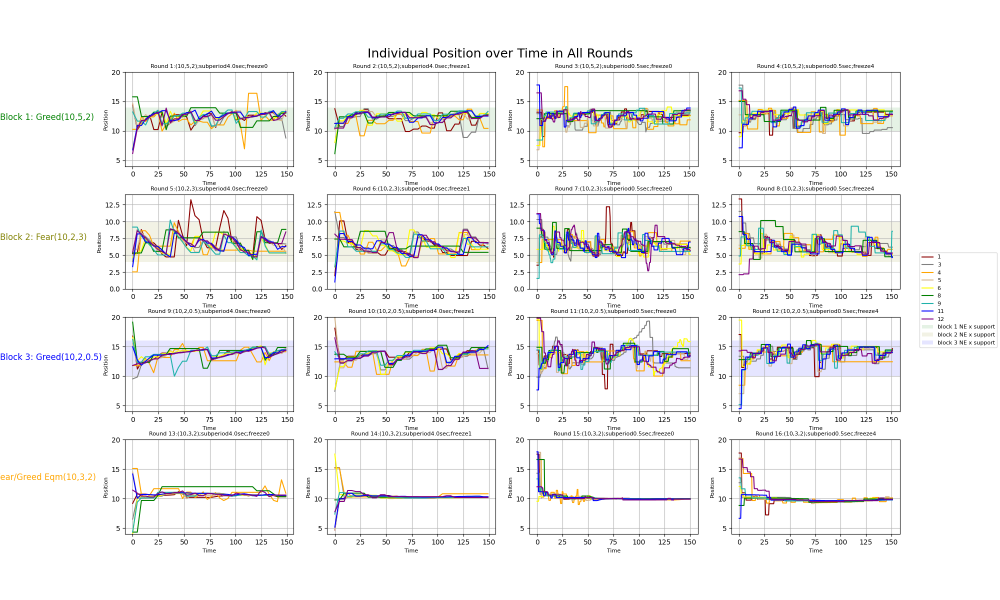

In [112]:
#weired behavior
#generate positions over time in all rounds
#block of game (10,5,2); (10,2,3), (10,2,0.5), (10,3,2)
%matplotlib notebook
df = df_copy[df_copy['session'] == 'fiy4zmu5']
df = df[(df['id_in_group']!= 2)&(df['id_in_group']!= 13)&(df['id_in_group']!= 7)&(df['id_in_group']!= 10)]
# df = df[(df['id_in_group']== 2)|(df['id_in_group']== 13)|(df['id_in_group']== 7)|(df['id_in_group']== 10)]
handles4 = []
labels4 = []
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
ylim = [[4,20], [0,14], [4,20], [4,20]]
# yticks = [[5,19], [0,14]]
NE_support = [[10,14], [4,10], [10,16], [8,12]]
shade_color = ['g', 'olive', 'b', 'orange']
# cmap = cm.get_cmap('Spectral')
# player_label = list(range(1,10))
NUM_COLORS = 13
plt.style.use('default')
# cm = plt.get_cmap('Spectral')
# col_lst = ['b',  'orange', 'green', 'red', 'purple', 'brown','black', 'pink', 'gray', 'olive', 'cyan', 'coral', 'tan']
col_lst = ['darkred',  'gray', 'orange', 'tan', 'yellow', 'green', 'lightseagreen',  'blue', 'purple']
# col_lst = [ 'black','olive', 'cyan', 'red']


rows = 4
cols = 4
fig = plt.figure(figsize=(5*cols,3*rows)) #single 5*3
fig.subplots_adjust(hspace=0.3, wspace=0.2)
for i in range(1, rows*cols+1):
    df_round = df[df['round_number']==i]
    subperiod = df_round.iloc[0]['subperiod']
    lam = int(df_round.iloc[0]['lambda'])
    gam = int(df_round.iloc[0]['gamma'])
    rho = float(df_round.iloc[0]['rho'])
    if rho>1:
        rho = int(rho)
    freeze = int(df_round.iloc[0]['freeze_period'])
    df_round = df_round.pivot(index='seconds', columns='id_in_group', values='strategy')
    player_label = df_round.columns
    title = 'Round ' +str(i) + ':'+'('+str(lam) +','+str(gam) +','+str(rho) +');'+ 'subperiod' + str(subperiod) + 'sec;freeze'+str(freeze)
    ax = fig.add_subplot(rows, cols, i)
#     ax.set_prop_cycle(color=[cm(1.*m/NUM_COLORS) for m in range(NUM_COLORS)])
    ax.set_prop_cycle(color=col_lst)
    ax.plot(df_round, label=player_label)
    ax.set_title(title, fontsize=8)
    ax.set_xlabel('Time', fontsize=8)
    ax.set_ylabel('Position', fontsize=8)
    if (gam == 5)&(rho == 2):
        ax.set_ylim(ylim[0])
#         ax.set_yticks(yticks[0])
        ax.axhspan(NE_support[0][0], NE_support[0][1], facecolor =shade_color[0], alpha = 0.1, label='block 1 NE x support')
        handles1, labels1 = ax.get_legend_handles_labels()
    elif (gam == 2)&(rho == 3):
        ax.set_ylim(ylim[1])
#         ax.set_yticks(yticks[1])
        ax.axhspan(NE_support[1][0], NE_support[1][1], facecolor =shade_color[1], alpha = 0.1, label='block 2 NE x support')
        handles2, labels2 = ax.get_legend_handles_labels()
    elif (gam == 2)&(rho == 0.5):
        ax.set_ylim(ylim[2])
#         ax.set_yticks(yticks[1])
        ax.axhspan(NE_support[2][0], NE_support[2][1], facecolor =shade_color[2], alpha = 0.1, label='block 3 NE x support')
        handles3, labels3 = ax.get_legend_handles_labels()    
    elif (gam == 3)&(rho == 2):
        ax.set_ylim(ylim[3])
#         ax.set_yticks(yticks[1])
#         ax.axhspan(NE_support[3][0], NE_support[3][1], facecolor =shade_color[3], alpha = 0.1, label='block 4 NE x support')
        handles4, labels4 = ax.get_legend_handles_labels()   
    ax.grid()
handles4.append(handles1[-1])
labels4.append(labels1[-1])
handles4.append(handles2[-1])
labels4.append(labels2[-1])
handles4.append(handles3[-1])
labels4.append(labels3[-1])
fig.text(0, 0.8, "Block 1: Greed(10,5,2)", color=shade_color[0], fontsize=12)
fig.text(0, 0.6, "Block 2: Fear(10,2,3)", color=shade_color[1], fontsize=12)
fig.text(0, 0.4, "Block 3: Greed(10,2,0.5)", color=shade_color[2], fontsize=12)
fig.text(-0.04, 0.2, "Block 4: Fear/Greed Eqm(10,3,2)", color=shade_color[3], fontsize=12)
fig.legend(handles4, labels4, loc='center right', fontsize=8)
fig.suptitle('Individual Position over Time in All Rounds', y=0.92, fontsize=18)
plt.show()
plt.savefig('position_over_time_normal.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


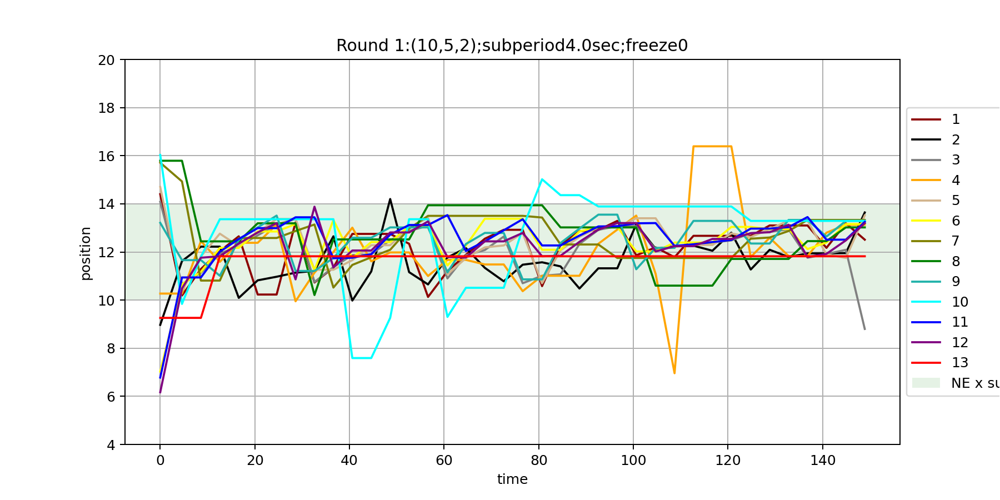

<IPython.core.display.Javascript object>


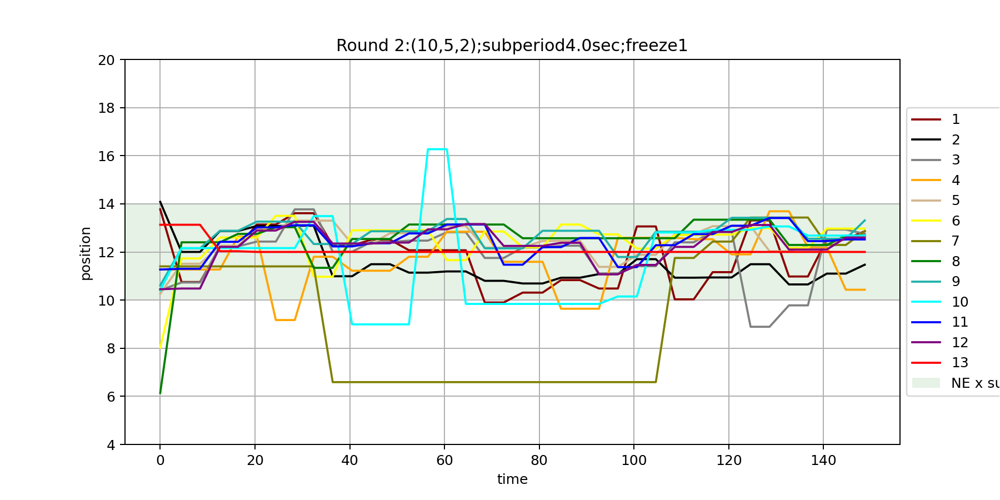

<IPython.core.display.Javascript object>


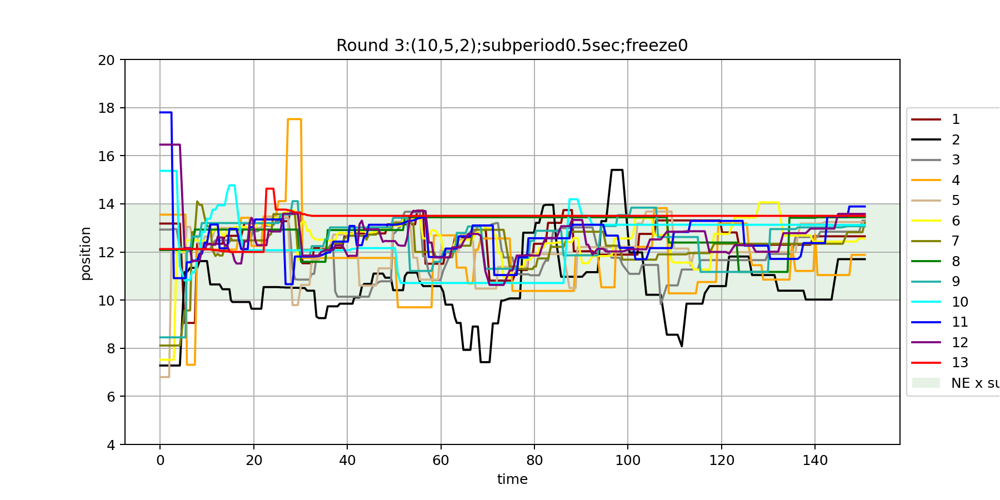

<IPython.core.display.Javascript object>


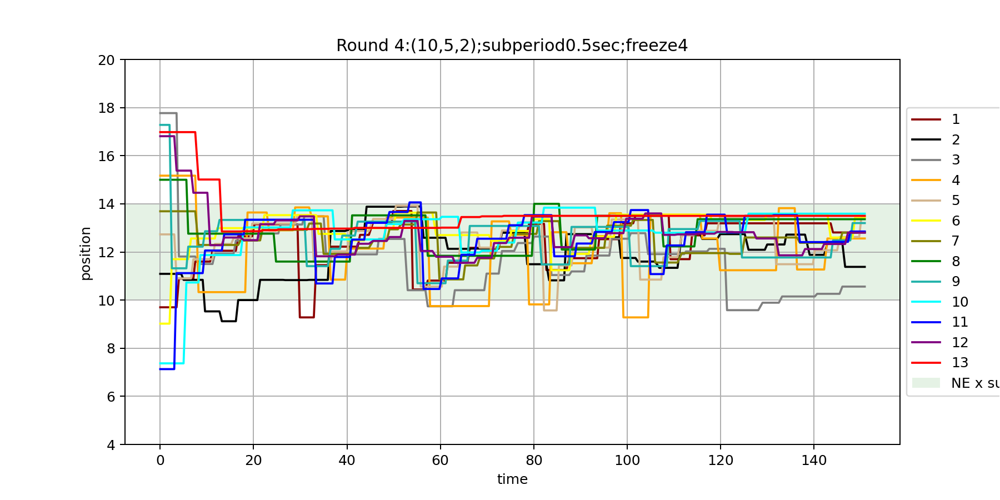

<IPython.core.display.Javascript object>


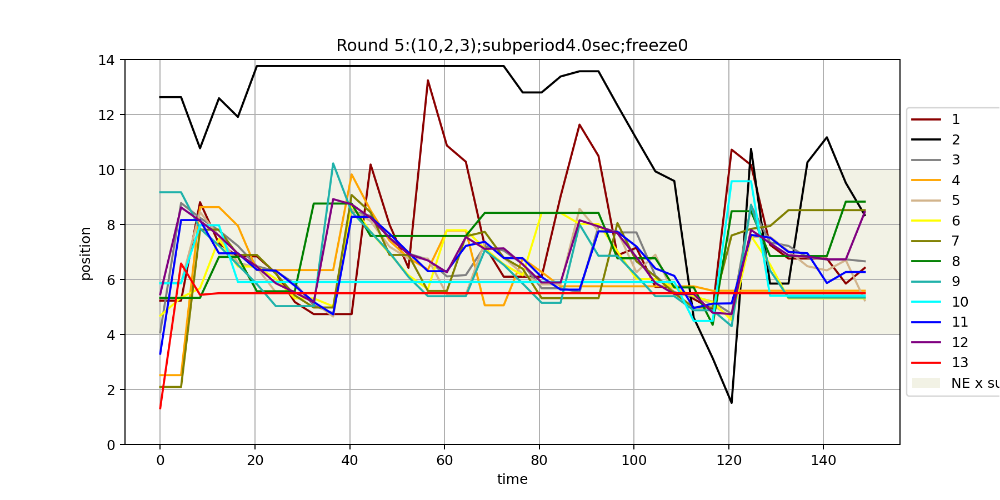

<IPython.core.display.Javascript object>


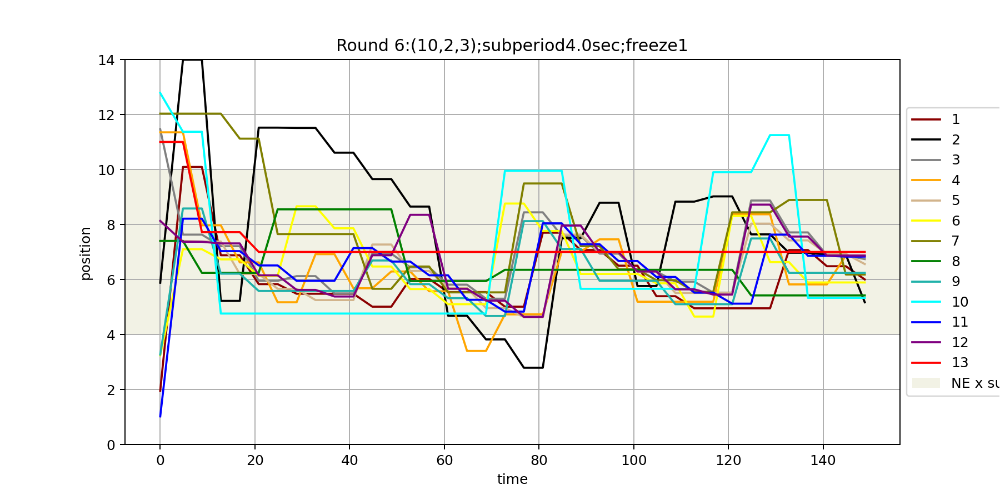

<IPython.core.display.Javascript object>


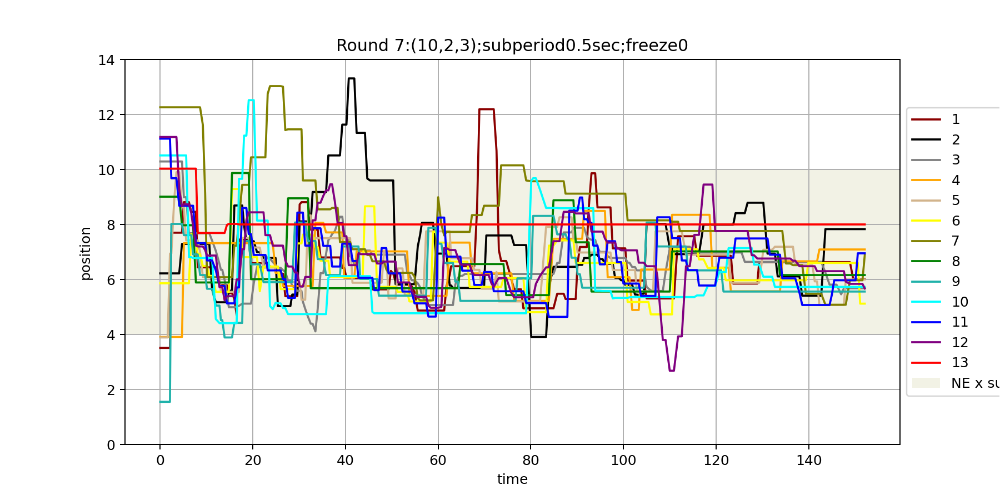

<IPython.core.display.Javascript object>


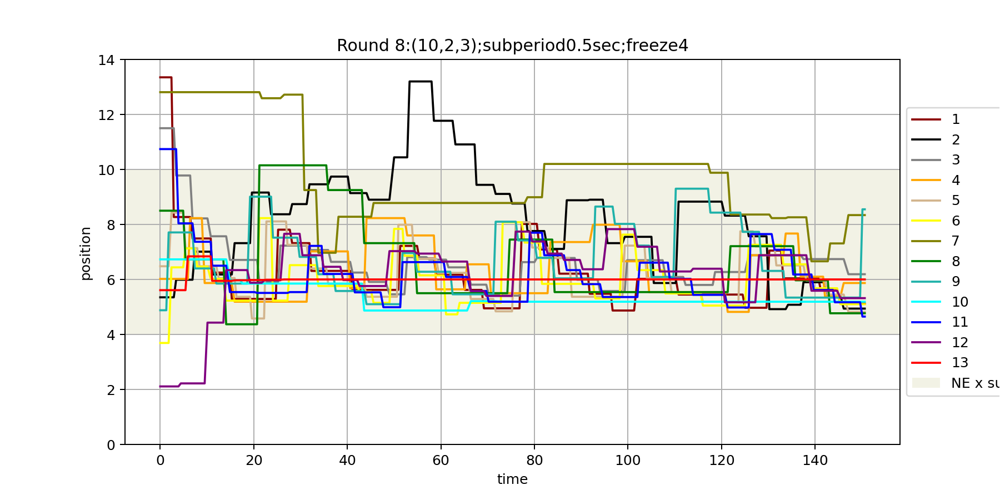

<IPython.core.display.Javascript object>


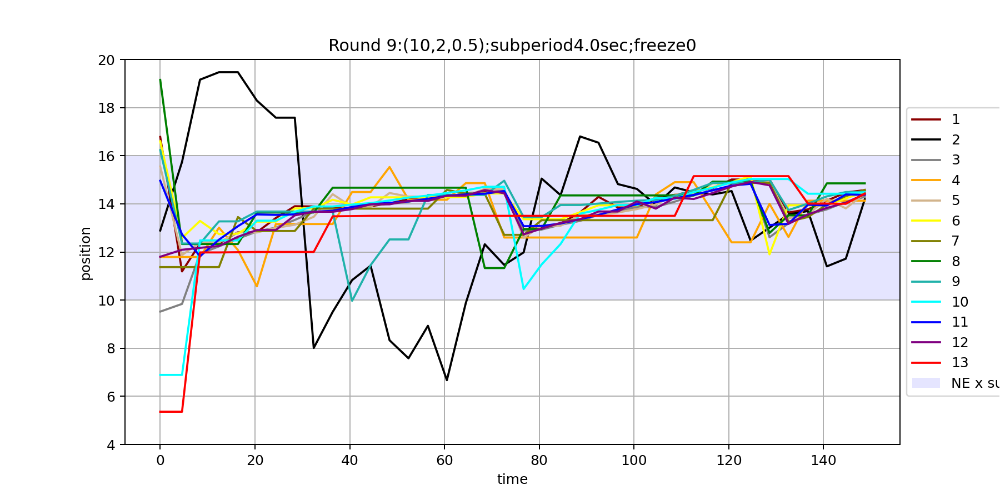

<IPython.core.display.Javascript object>


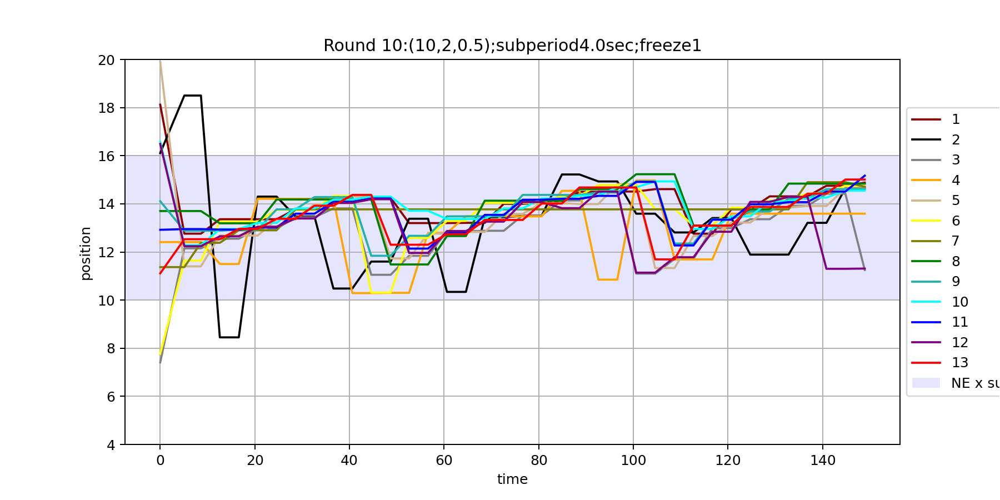

<IPython.core.display.Javascript object>


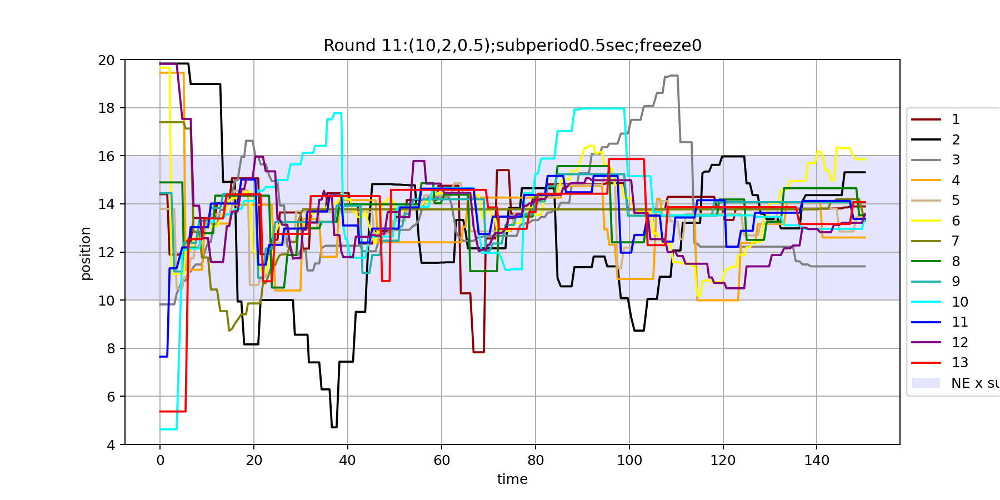

<IPython.core.display.Javascript object>


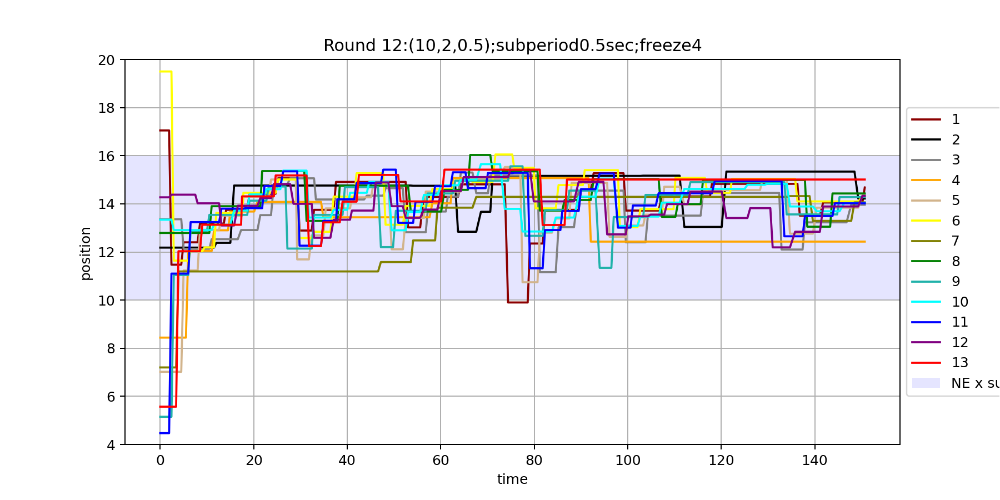

<IPython.core.display.Javascript object>


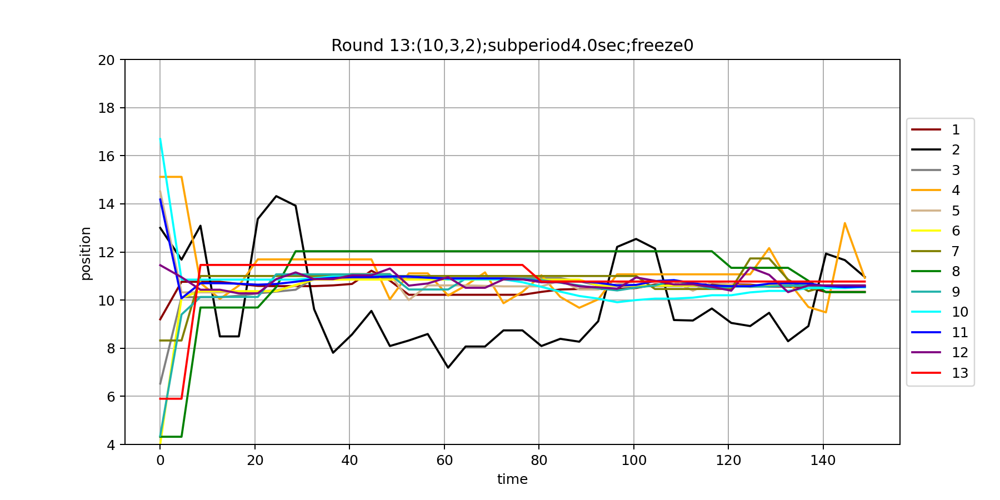

<IPython.core.display.Javascript object>


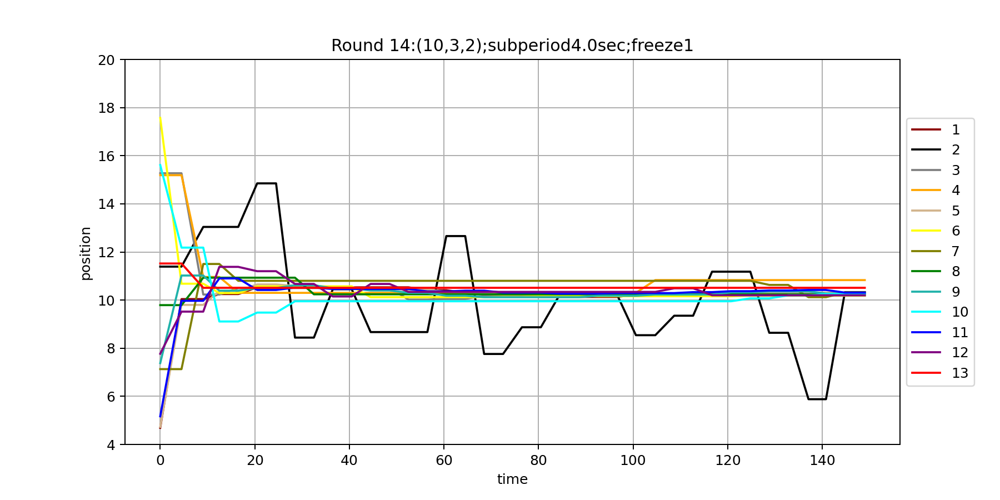

<IPython.core.display.Javascript object>


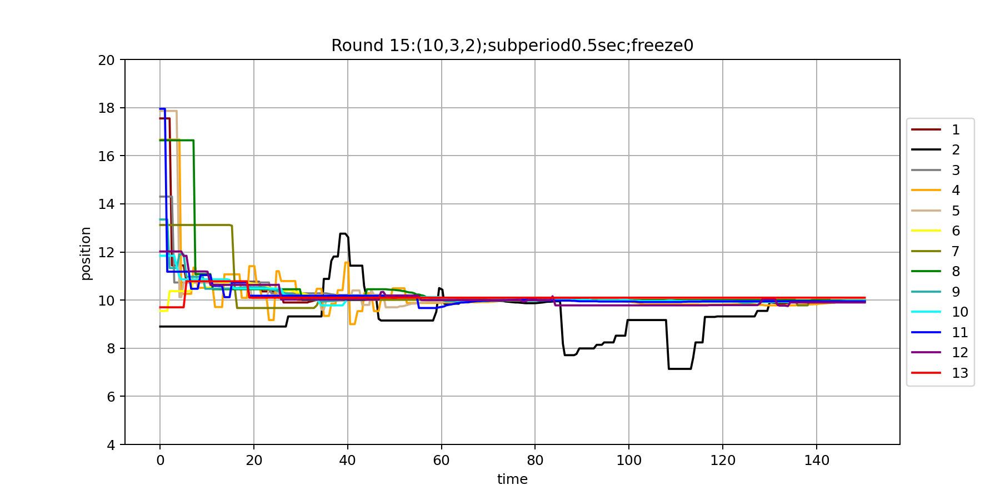

<IPython.core.display.Javascript object>


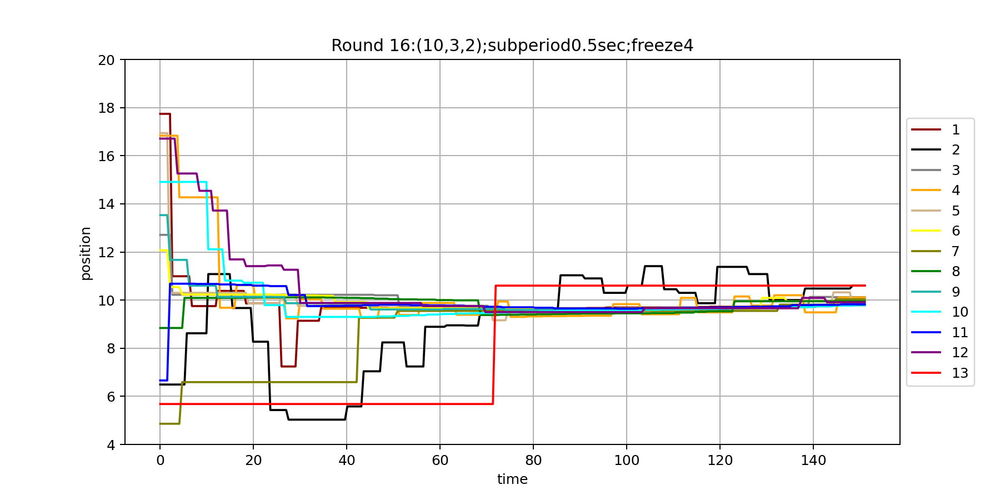

In [5]:
#check for practice rounds
#generate strategy over time graph in all rounds
%matplotlib notebook
df = df_copy[df_copy['session'] == 'fiy4zmu5']
# df = df[(df['id_in_group']!= 2)&(df['id_in_group']!= 13)&(df['id_in_group']!= 7)&(df['id_in_group']!= 10)]
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
handles = []
labels = []

ylim = [[4,20], [0,14], [4,20], [4,20]]
# yticks = [[5,19], [0,14]]
NE_support = [[10,14], [4,10], [10,16], [8,12]]
shade_color = ['g', 'olive', 'b', 'orange']
# cmap = cm.get_cmap('Spectral')
# print(cmap)
col_lst = ['darkred',  'black', 'gray', 'orange', 'tan', 'yellow','olive', 'green', 'lightseagreen', 'cyan', 'blue', 'purple', 'red']

for i in range(1,17):
    df_round = df[df['round_number']==i]
    subperiod = df_round.iloc[0]['subperiod']
    lam = int(df_round.iloc[0]['lambda'])
    gam = int(df_round.iloc[0]['gamma'])
    rho = float(df_round.iloc[0]['rho'])
    if rho>1:
        rho = int(rho)
    freeze = int(df_round.iloc[0]['freeze_period'])
    title = 'Round ' +str(i) + ':'+'('+str(lam) +','+str(gam) +','+str(rho) +');'+ 'subperiod' + str(subperiod) + 'sec;freeze'+str(freeze)
    df_round = df_round.pivot(index='seconds', columns='id_in_group', values='strategy')
    df_round.plot(kind="line", figsize=(10, 5),color=col_lst, label='Player ID')
    plt.xlabel('time')
    plt.ylabel('position')
    if (gam == 5)&(rho == 2):
        plt.ylim(ylim[0])
        plt.axhspan(NE_support[0][0], NE_support[0][1], facecolor =shade_color[0], alpha = 0.1, label='NE x support')
    elif (gam == 2)&(rho == 3):
        plt.ylim(ylim[1])
        plt.axhspan(NE_support[1][0], NE_support[1][1], facecolor =shade_color[1], alpha = 0.1, label='NE x support')
    elif (gam == 2)&(rho == 0.5):
        plt.ylim(ylim[2])
        plt.axhspan(NE_support[2][0], NE_support[2][1], facecolor =shade_color[2], alpha = 0.1, label='NE x support')  
    elif (gam == 3)&(rho == 2):
        plt.ylim(ylim[3])
    plt.title(title)
    plt.grid()
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()
    figure_name = str(lam) +'_'+str(gam) +'_'+str(rho) + '_subperiod' + str(subperiod) + '_freeze'+str(freeze)+ '_round'+str(i)
    plt.savefig('all_pilot2_'+figure_name +'.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


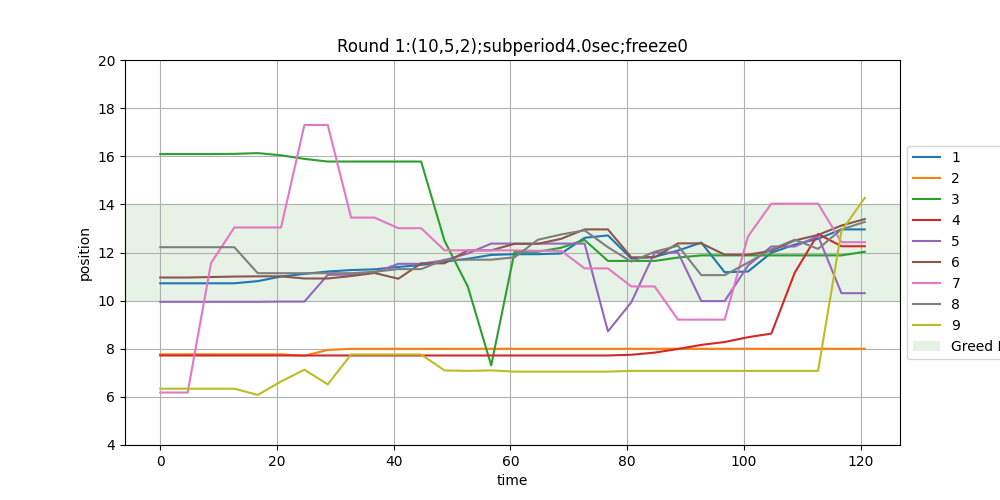

<IPython.core.display.Javascript object>


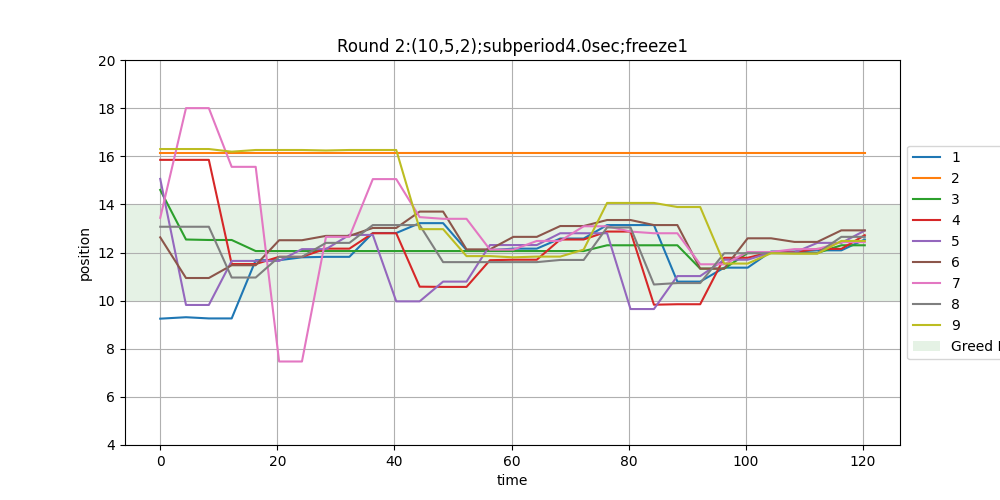

<IPython.core.display.Javascript object>


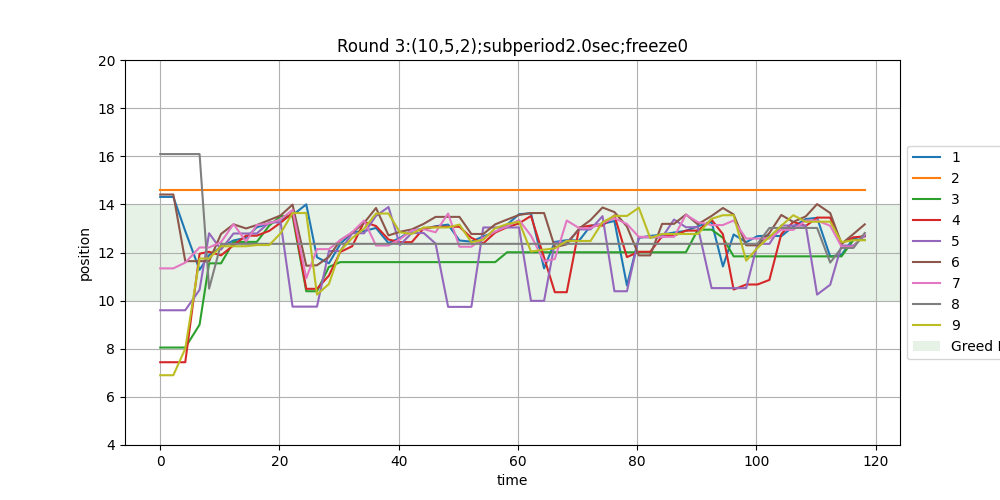

<IPython.core.display.Javascript object>


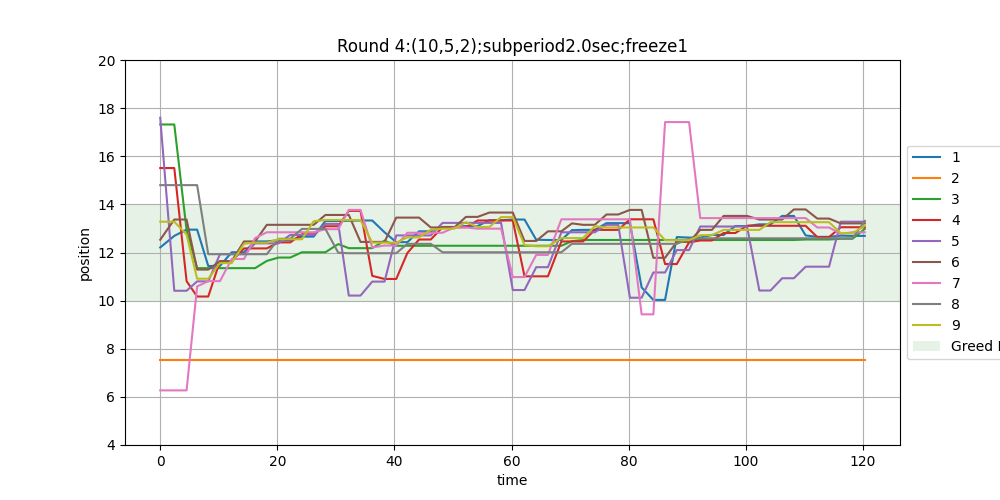

<IPython.core.display.Javascript object>


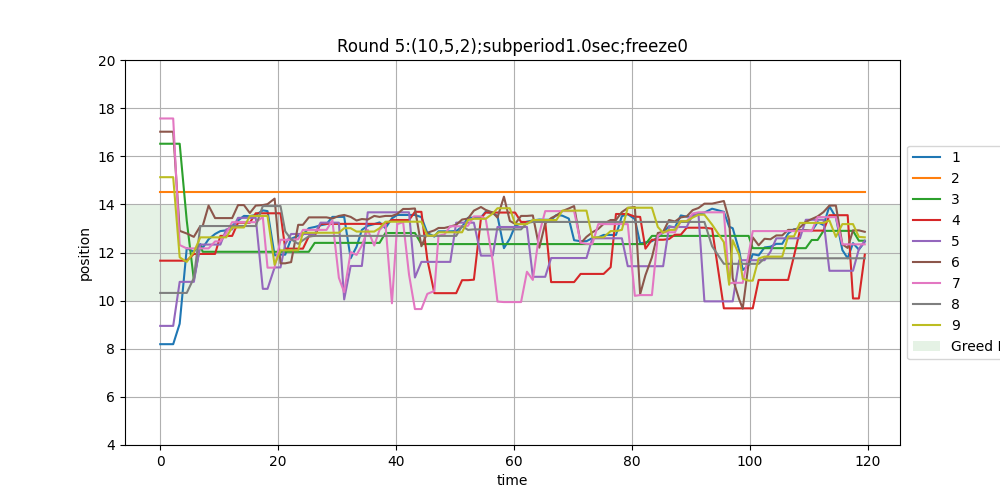

<IPython.core.display.Javascript object>


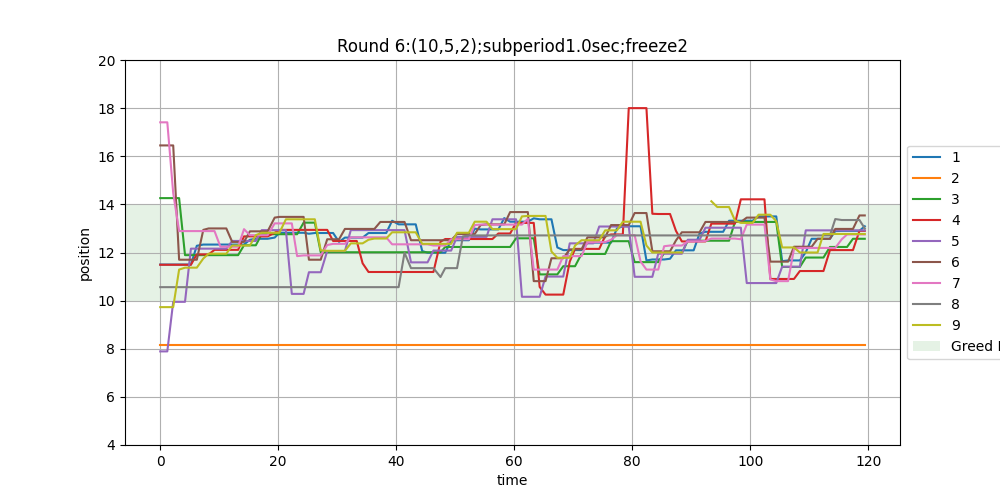

<IPython.core.display.Javascript object>


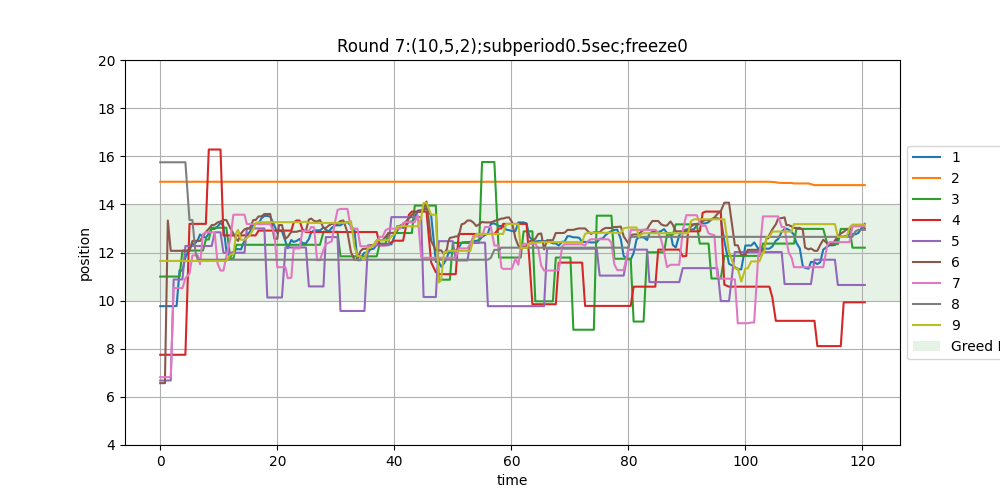

<IPython.core.display.Javascript object>


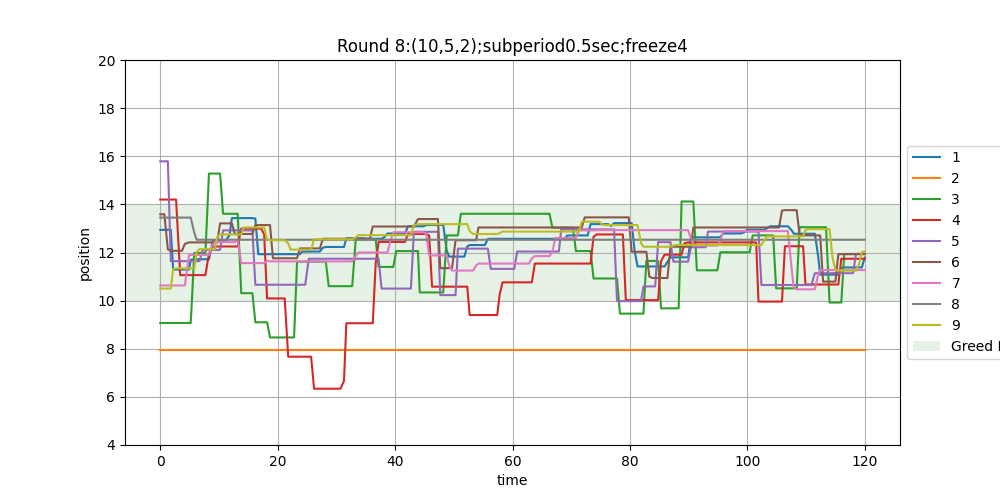

<IPython.core.display.Javascript object>


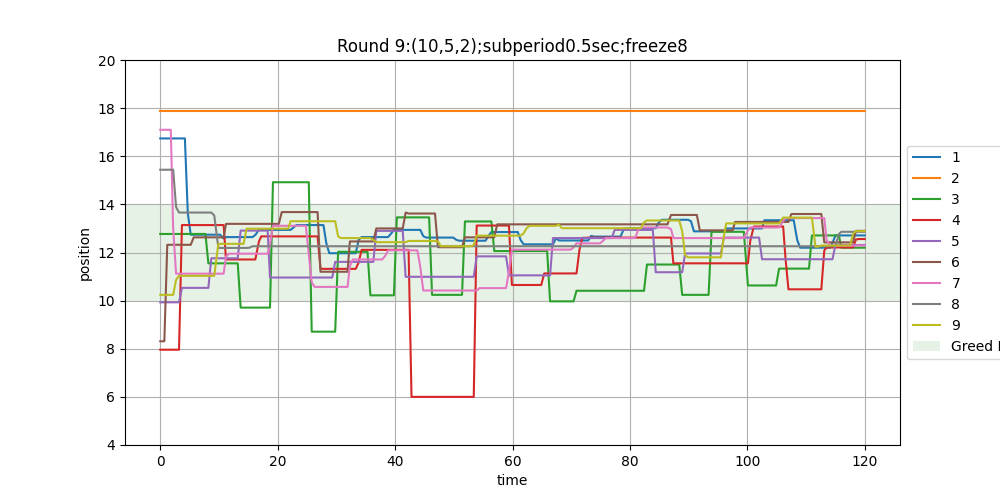

<IPython.core.display.Javascript object>


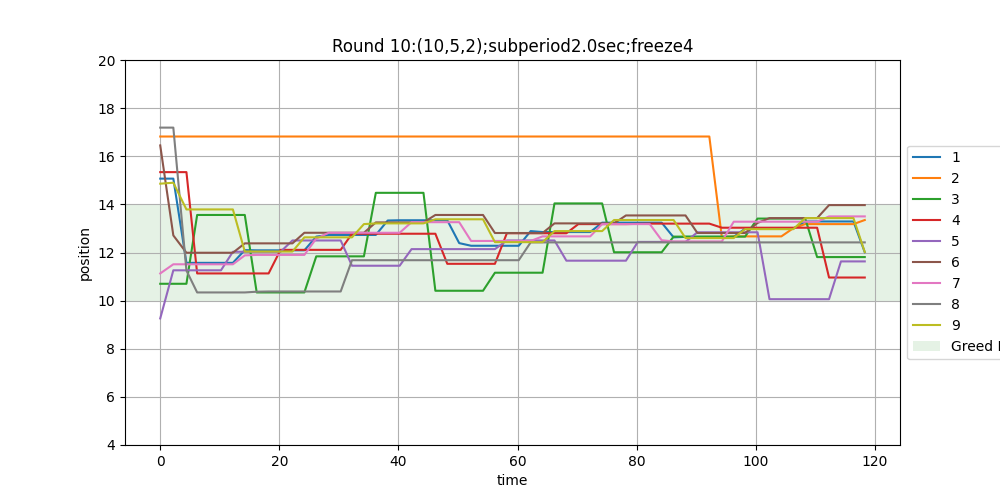

<IPython.core.display.Javascript object>


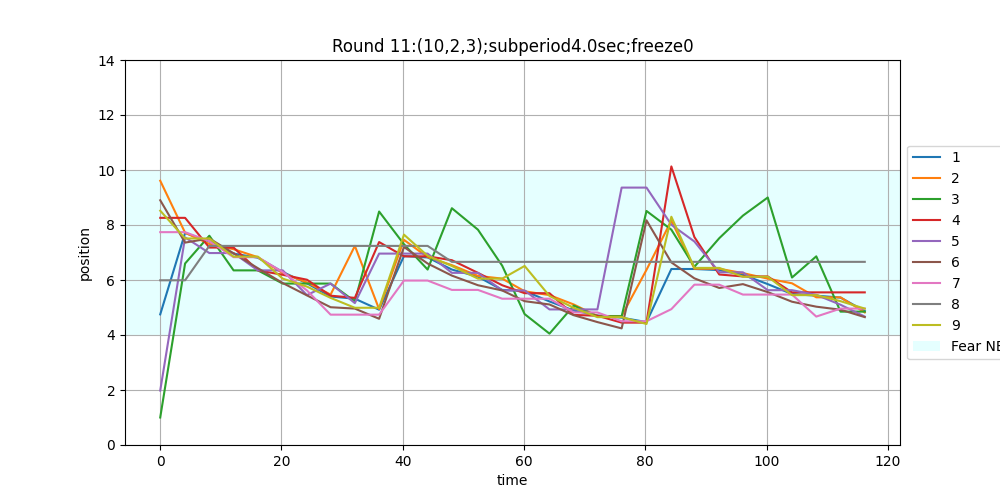

<IPython.core.display.Javascript object>


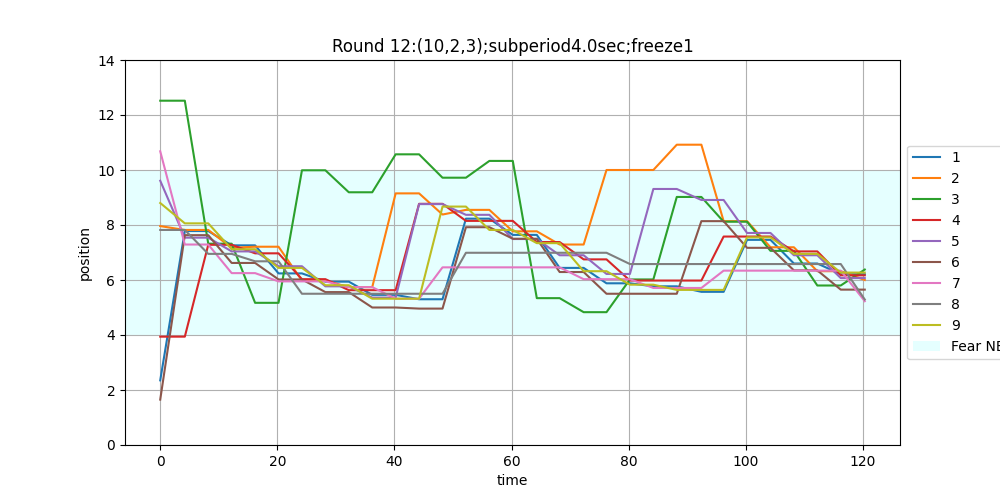

<IPython.core.display.Javascript object>


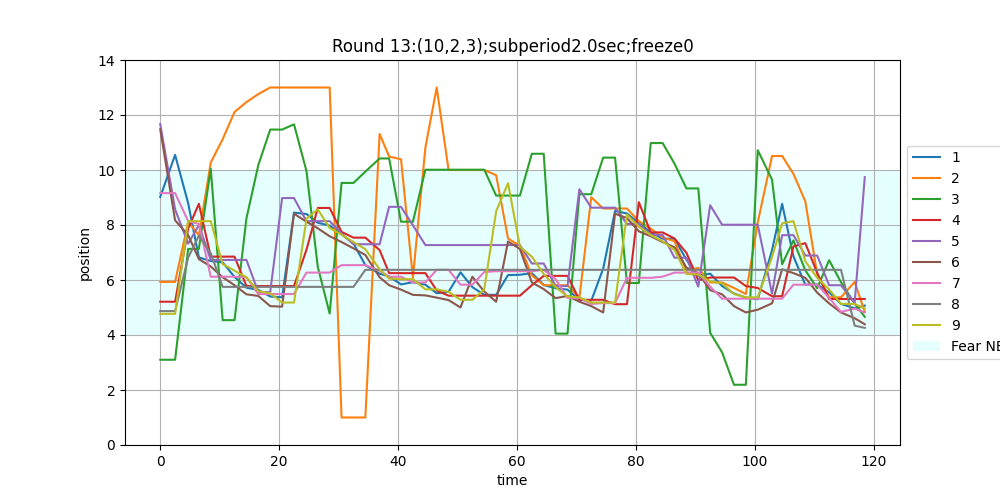

<IPython.core.display.Javascript object>


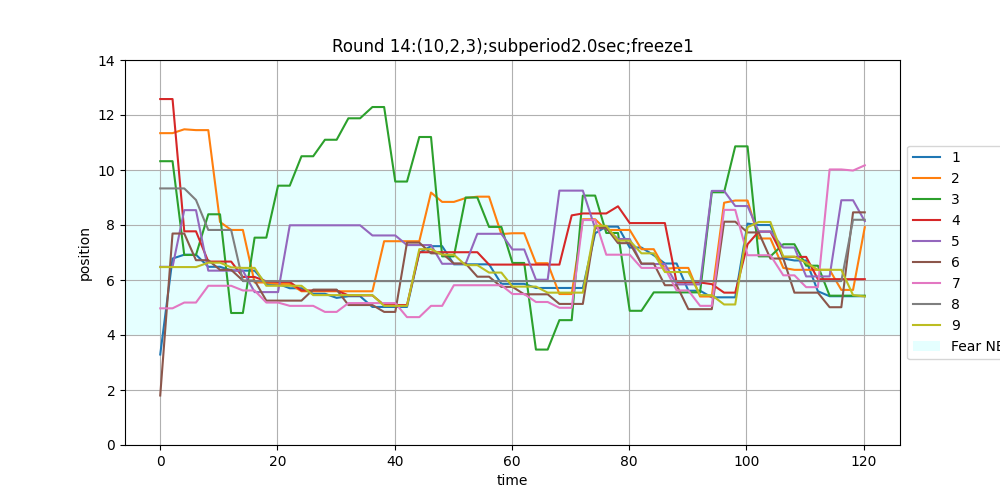

<IPython.core.display.Javascript object>


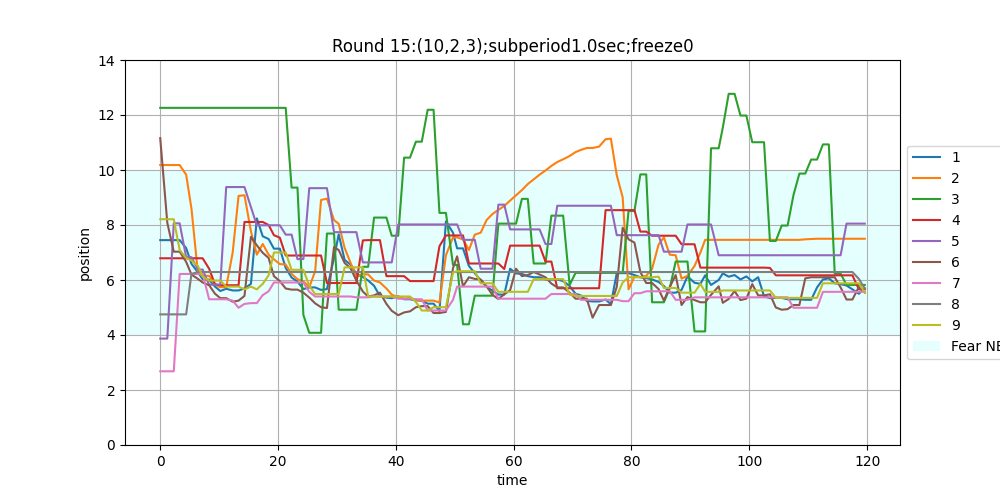

<IPython.core.display.Javascript object>


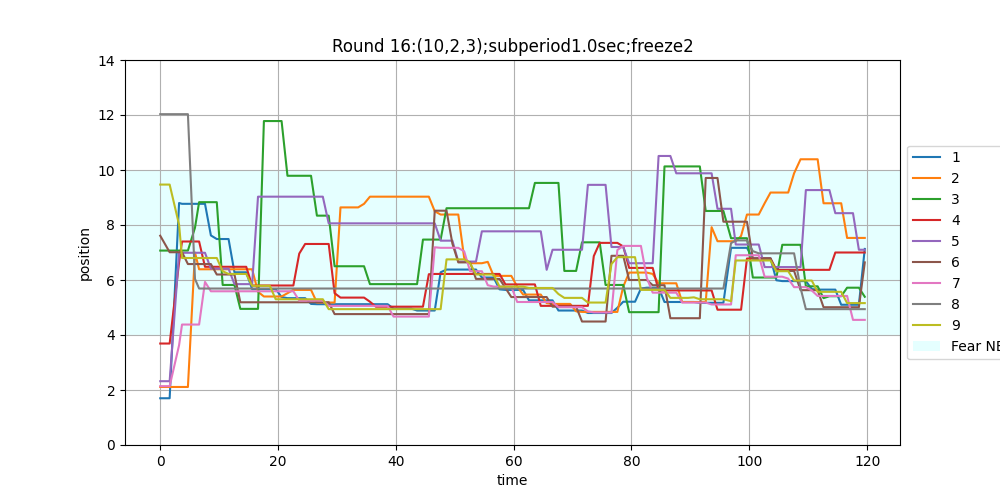

<IPython.core.display.Javascript object>


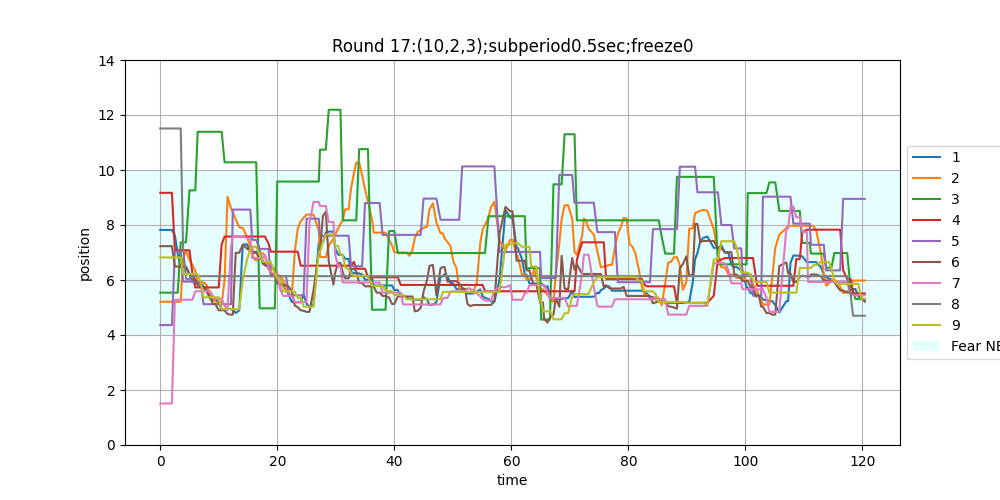

<IPython.core.display.Javascript object>


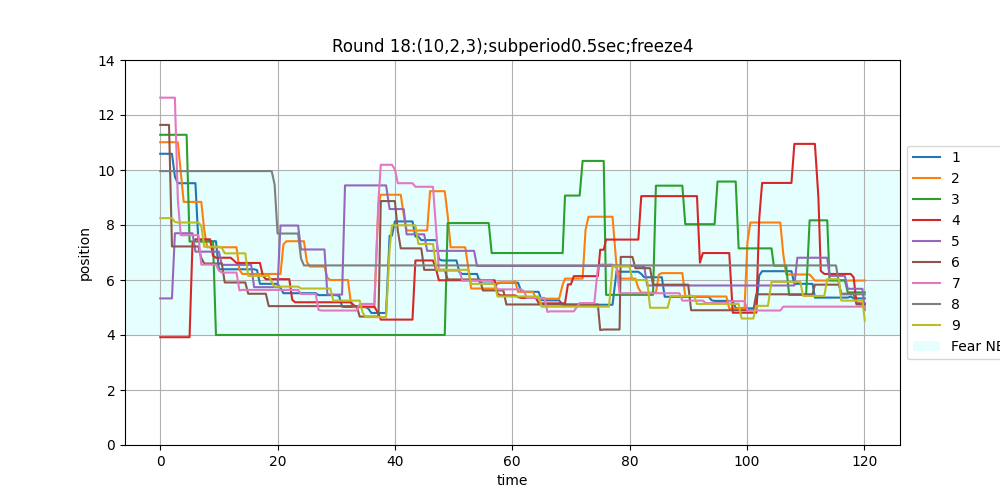

In [261]:
#not use
#generate strategy over time graph in all rounds
%matplotlib notebook
df = df_copy[df_copy['strategy'] < 100]
handles = []
labels = []
freeze_period_list = [0,1,0,1,0,2,0,4,8,4,0,1,0,1,0,2,0,4]
ylim = [[4,20], [0,14]]
# yticks = [[5,19], [0,14]]
NE_support = [[10,14], [4,10]]

for i in range(1,19):
    df_round = df[df['round_number']==i]
    subperiod = df_round.iloc[0]['subperiod']
    lam = int(df_round.iloc[0]['lambda'])
    gam = int(df_round.iloc[0]['gamma'])
    rho = int(df_round.iloc[0]['rho'])
    freeze = freeze_period_list[i-1]
    title = 'Round ' +str(i) + ':'+'('+str(lam) +','+str(gam) +','+str(rho) +');'+ 'subperiod' + str(subperiod) + 'sec;freeze'+str(freeze)
    df_round = df_round.pivot(index='seconds', columns='id_in_group', values='strategy')
    df_round.plot(kind="line", figsize=(10, 5), label='Player ID')
    plt.xlabel('time')
    plt.ylabel('position')
    if gam == 5:
        plt.ylim(ylim[0])
        plt.axhspan(NE_support[0][0], NE_support[0][1], facecolor ='g', alpha = 0.1, label='Greed NE x support')
#         handles, labels = plt.get_legend_handles_labels()
    else:
        plt.ylim(ylim[1])
        plt.axhspan(NE_support[1][0], NE_support[1][1], facecolor ='cyan', alpha = 0.1, label='Fear NE x support')
#         handles, labels = plt.get_legend_handles_labels()
    plt.title(title)
    plt.grid()
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()
    figure_name = str(lam) +'_'+str(gam) +'_'+str(rho) + '_subperiod' + str(subperiod) + '_freeze'+str(freeze)+ '_round'+str(i)
    plt.savefig(figure_name +'.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


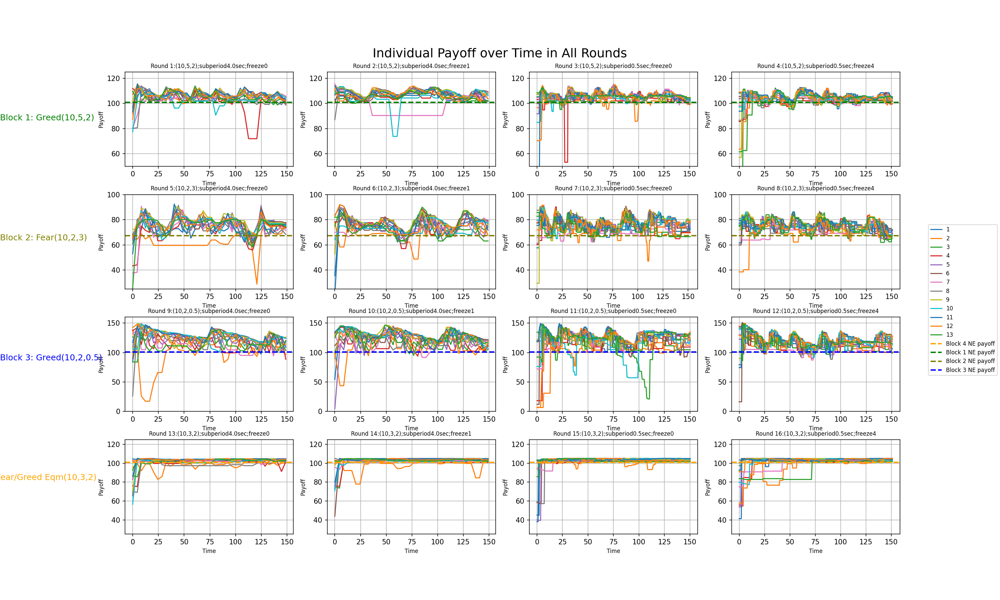

In [49]:
#generate payoffs over time in all rounds
#block of game (10,5,2); (10,2,3), (10,2,0.5), (10,3,2)
%matplotlib notebook
df = df_copy[df_copy['session'] == 'fiy4zmu5']
handles4 = []
labels4 = []
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num

ylim = [[50,125], [25,100], [0,160], [25,125]]
# yticks = [[5,19], [0,14]]
NE_support = [[10,14], [4,10], [10,16], [8,12]]
shade_color = ['g', 'olive', 'b', 'orange']
NE_payoff = [101, 67.33, 101, 101]
# player_label = list(range(1,10))
rows = 4
cols = 4
fig = plt.figure(figsize=(5*cols,3*rows)) #single 5*3
fig.subplots_adjust(hspace=0.3, wspace=0.2)
for i in range(1, rows*cols+1):
    df_round = df[df['round_number']==i]
    player_label = df_round.id_in_group.unique()
    player_label.sort()
    subperiod = df_round.iloc[0]['subperiod']
    lam = int(df_round.iloc[0]['lambda'])
    gam = int(df_round.iloc[0]['gamma'])
    rho = float(df_round.iloc[0]['rho'])
    if rho>1:
        rho = int(rho)
    freeze = int(df_round.iloc[0]['freeze_period'])
    df_round = df_round.pivot(index='seconds', columns='id_in_group', values='payoff')
#     player_label = df_round.columns
    title = 'Round ' +str(i) + ':'+'('+str(lam) +','+str(gam) +','+str(rho) +');'+ 'subperiod' + str(subperiod) + 'sec;freeze'+str(freeze)
    ax = fig.add_subplot(rows, cols, i)
    ax.plot(df_round, label=player_label)
    ax.set_title(title, fontsize=8)
    ax.set_xlabel('Time', fontsize=8)
    ax.set_ylabel('Payoff', fontsize=8)
    if (gam == 5)&(rho == 2):
        ax.set_ylim(ylim[0])
#         ax.set_yticks(yticks[0])
        ax.axhline(y=NE_payoff[0], color=shade_color[0], linestyle='--',linewidth=2, label='Block 1 NE payoff')
        handles1, labels1 = ax.get_legend_handles_labels()
    elif (gam == 2)&(rho == 3):
        ax.set_ylim(ylim[1])
#         ax.set_yticks(yticks[1])
        ax.axhline(y=NE_payoff[1], color=shade_color[1], linestyle='--',linewidth=2, label='Block 2 NE payoff')
        handles2, labels2 = ax.get_legend_handles_labels()
    elif (gam == 2)&(rho == 0.5):
        ax.set_ylim(ylim[2])
#         ax.set_yticks(yticks[1])
        ax.axhline(y=NE_payoff[2], color=shade_color[2], linestyle='--',linewidth=2, label='Block 3 NE payoff')
        handles3, labels3 = ax.get_legend_handles_labels()    
    elif (gam == 3)&(rho == 2):
        ax.set_ylim(ylim[3])
#         ax.set_yticks(yticks[1])
        ax.axhline(y=NE_payoff[3], color=shade_color[3], linestyle='--',linewidth=2, label='Block 4 NE payoff')
        handles4, labels4 = ax.get_legend_handles_labels() 
    ax.grid()
handles4.append(handles1[-1])
labels4.append(labels1[-1])
handles4.append(handles2[-1])
labels4.append(labels2[-1])
handles4.append(handles3[-1])
labels4.append(labels3[-1])
fig.text(0, 0.8, "Block 1: Greed(10,5,2)", color=shade_color[0], fontsize=12)
fig.text(0, 0.6, "Block 2: Fear(10,2,3)", color=shade_color[1], fontsize=12)
fig.text(0, 0.4, "Block 3: Greed(10,2,0.5)", color=shade_color[2], fontsize=12)
fig.text(-0.04, 0.2, "Block 4: Fear/Greed Eqm(10,3,2)", color=shade_color[3], fontsize=12)
fig.legend(handles4, labels4, loc='center right', fontsize=8)
fig.suptitle('Individual Payoff over Time in All Rounds', y=0.92, fontsize=18)
plt.show()
plt.savefig('payoff_over_time_all.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


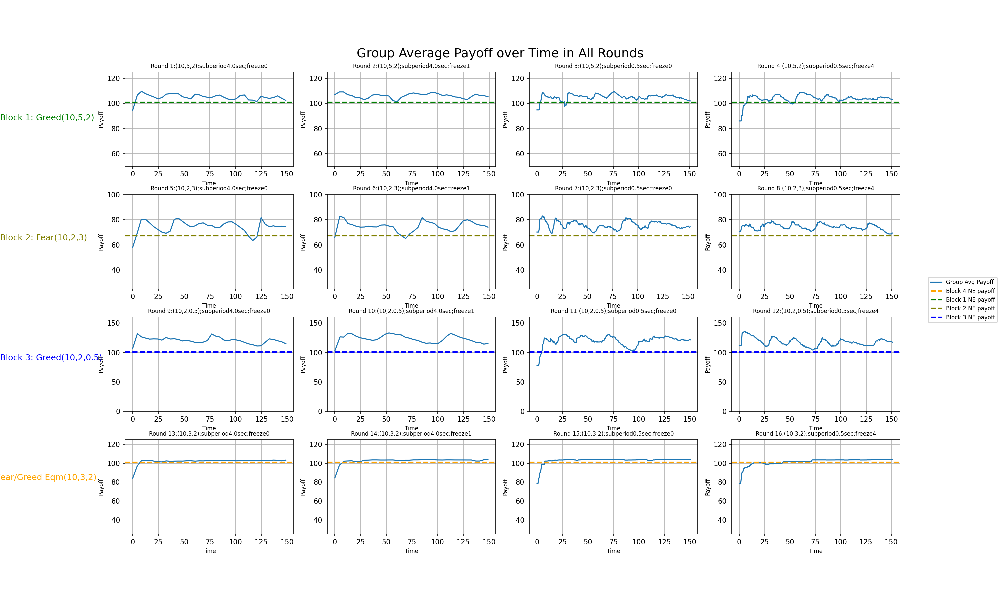

In [50]:
#group average over time in all rounds

%matplotlib notebook
df = df_copy[df_copy['session'] == 'fiy4zmu5']
handles4 = []
labels4 = []
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
ylim = [[50,125], [25,100], [0,160], [25,125]]
# yticks = [[5,19], [0,14]]
NE_support = [[10,14], [4,10], [10,16], [8,12]]
shade_color = ['g', 'olive', 'b', 'orange']
NE_payoff = [101, 67.33, 101, 101]
# player_label = list(range(1,10))
rows = 4
cols = 4
fig = plt.figure(figsize=(5*cols,3*rows)) #single 5*3
fig.subplots_adjust(hspace=0.3, wspace=0.2)
for i in range(1, rows*cols+1):
    df_round = df[df['round_number']==i]
    
    subperiod = df_round.iloc[0]['subperiod']
    lam = int(df_round.iloc[0]['lambda'])
    gam = int(df_round.iloc[0]['gamma'])
    rho = float(df_round.iloc[0]['rho'])
    if rho>1:
        rho = int(rho)
    freeze = int(df_round.iloc[0]['freeze_period'])
    df_round = df_round.groupby('seconds')['payoff'].mean()
#     df_round = df_round.reset_index()
    title = 'Round ' +str(i) + ':'+'('+str(lam) +','+str(gam) +','+str(rho) +');'+ 'subperiod' + str(subperiod) + 'sec;freeze'+str(freeze)
    ax = fig.add_subplot(rows, cols, i)
    ax.plot(df_round, label='Group Avg Payoff')
    ax.set_title(title, fontsize=8)
    ax.set_xlabel('Time', fontsize=8)
    ax.set_ylabel('Payoff', fontsize=8)
    if (gam == 5)&(rho == 2):
        ax.set_ylim(ylim[0])
#         ax.set_yticks(yticks[0])
        ax.axhline(y=NE_payoff[0], color=shade_color[0], linestyle='--',linewidth=2, label='Block 1 NE payoff')
        handles1, labels1 = ax.get_legend_handles_labels()
    elif (gam == 2)&(rho == 3):
        ax.set_ylim(ylim[1])
#         ax.set_yticks(yticks[1])
        ax.axhline(y=NE_payoff[1], color=shade_color[1], linestyle='--',linewidth=2, label='Block 2 NE payoff')
        handles2, labels2 = ax.get_legend_handles_labels()
    elif (gam == 2)&(rho == 0.5):
        ax.set_ylim(ylim[2])
#         ax.set_yticks(yticks[1])
        ax.axhline(y=NE_payoff[2], color=shade_color[2], linestyle='--',linewidth=2, label='Block 3 NE payoff')
        handles3, labels3 = ax.get_legend_handles_labels()    
    elif (gam == 3)&(rho == 2):
        ax.set_ylim(ylim[3])
#         ax.set_yticks(yticks[1])
        ax.axhline(y=NE_payoff[3], color=shade_color[3], linestyle='--',linewidth=2, label='Block 4 NE payoff')
        handles4, labels4 = ax.get_legend_handles_labels() 
    ax.grid()
handles4.append(handles1[-1])
labels4.append(labels1[-1])
handles4.append(handles2[-1])
labels4.append(labels2[-1])
handles4.append(handles3[-1])
labels4.append(labels3[-1])
fig.text(0, 0.8, "Block 1: Greed(10,5,2)", color=shade_color[0], fontsize=12)
fig.text(0, 0.6, "Block 2: Fear(10,2,3)", color=shade_color[1], fontsize=12)
fig.text(0, 0.4, "Block 3: Greed(10,2,0.5)", color=shade_color[2], fontsize=12)
fig.text(-0.04, 0.2, "Block 4: Fear/Greed Eqm(10,3,2)", color=shade_color[3], fontsize=12)
fig.legend(handles4, labels4, loc='center right', fontsize=8)
fig.suptitle('Group Average Payoff over Time in All Rounds', y=0.92, fontsize=18)
plt.show()
plt.savefig('group_avg_payoff_over_time_all.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


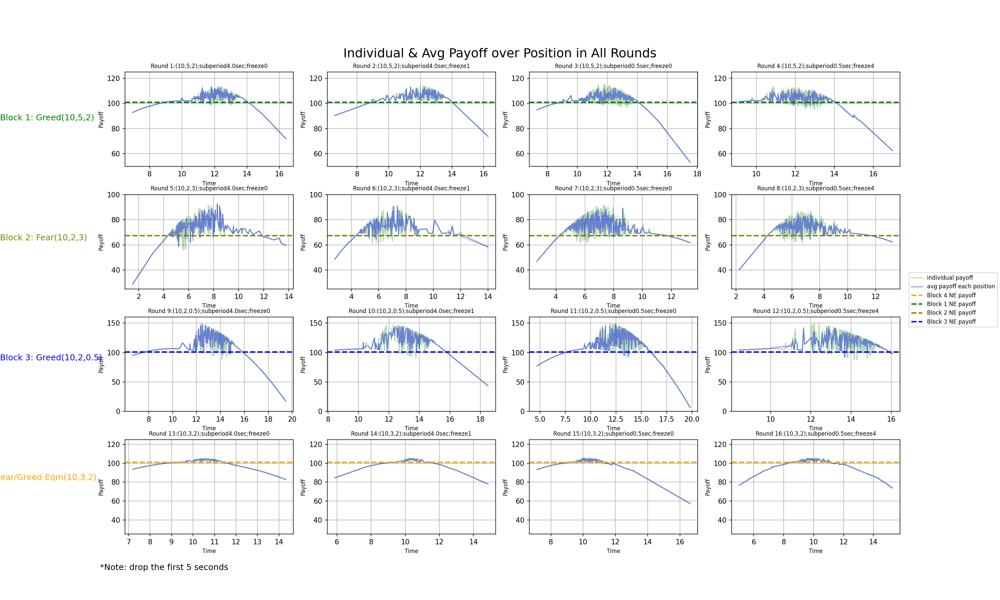

In [52]:
#generate payoffs over strategy in all rounds
%matplotlib notebook
df = df_copy[df_copy['session'] == 'fiy4zmu5']
handles4 = []
labels4 = []
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df = df.loc[df['seconds']>5] # drop the first 5 seconds
df['round_number'] = df['round_number'] - practice_num
ylim = [[50,125], [25,100], [0,160], [25,125]]
# yticks = [[5,19], [0,14]]
NE_support = [[10,14], [4,10], [10,16], [8,12]]
shade_color = ['g', 'olive', 'b', 'orange']
NE_payoff = [101, 67.33, 101, 101]
# player_label = list(range(1,10))
rows = 4
cols = 4
fig = plt.figure(figsize=(5*cols,3*rows)) #single 5*3
fig.subplots_adjust(hspace=0.3, wspace=0.2)
for i in range(1, rows*cols+1):
    df_round = df[df['round_number']==i]
    subperiod = df_round.iloc[0]['subperiod']
    lam = int(df_round.iloc[0]['lambda'])
    gam = int(df_round.iloc[0]['gamma'])
    rho = float(df_round.iloc[0]['rho'])
    if rho>1:
        rho = int(rho)
    freeze = int(df_round.iloc[0]['freeze_period'])
    df_round = df_round.sort_values(by=['strategy'])
    df_avg_payoff_position = df_round.groupby('strategy')['payoff'].mean()
    df_avg_payoff_position=df_avg_payoff_position.reset_index()
#     player_label = df_round.columns
    title = 'Round ' +str(i) + ':'+'('+str(lam) +','+str(gam) +','+str(rho) +');'+ 'subperiod' + str(subperiod) + 'sec;freeze'+str(freeze)
    ax = fig.add_subplot(rows, cols, i)
    ax.plot(df_round['strategy'],df_round['payoff'], alpha=0.3, c='g', label='individual payoff')
    ax.plot(df_avg_payoff_position['strategy'], df_avg_payoff_position['payoff'], c='b', alpha=0.4, label='avg payoff each position')
    ax.set_title(title, fontsize=8)
    ax.set_xlabel('Time', fontsize=8)
    ax.set_ylabel('Payoff', fontsize=8)
    if (gam == 5)&(rho == 2):
        ax.set_ylim(ylim[0])
#         ax.set_yticks(yticks[0])
        ax.axhline(y=NE_payoff[0], color=shade_color[0], linestyle='--',linewidth=2, label='Block 1 NE payoff')
        handles1, labels1 = ax.get_legend_handles_labels()
    elif (gam == 2)&(rho == 3):
        ax.set_ylim(ylim[1])
#         ax.set_yticks(yticks[1])
        ax.axhline(y=NE_payoff[1], color=shade_color[1], linestyle='--',linewidth=2, label='Block 2 NE payoff')
        handles2, labels2 = ax.get_legend_handles_labels()
    elif (gam == 2)&(rho == 0.5):
        ax.set_ylim(ylim[2])
#         ax.set_yticks(yticks[1])
        ax.axhline(y=NE_payoff[2], color=shade_color[2], linestyle='--',linewidth=2, label='Block 3 NE payoff')
        handles3, labels3 = ax.get_legend_handles_labels()    
    elif (gam == 3)&(rho == 2):
        ax.set_ylim(ylim[3])
#         ax.set_yticks(yticks[1])
        ax.axhline(y=NE_payoff[3], color=shade_color[3], linestyle='--',linewidth=2, label='Block 4 NE payoff')
        handles4, labels4 = ax.get_legend_handles_labels()
    ax.grid()
handles4.append(handles1[-1])
labels4.append(labels1[-1])
handles4.append(handles2[-1])
labels4.append(labels2[-1])
handles4.append(handles3[-1])
labels4.append(labels3[-1])
fig.text(0, 0.8, "Block 1: Greed(10,5,2)", color=shade_color[0], fontsize=12)
fig.text(0, 0.6, "Block 2: Fear(10,2,3)", color=shade_color[1], fontsize=12)
fig.text(0, 0.4, "Block 3: Greed(10,2,0.5)", color=shade_color[2], fontsize=12)
fig.text(-0.04, 0.2, "Block 4: Fear/Greed Eqm(10,3,2)", color=shade_color[3], fontsize=12)
fig.legend(handles4, labels4, loc='center right', fontsize=8)
fig.suptitle('Individual & Avg Payoff over Position in All Rounds', y=0.92, fontsize=18)
plt.figtext(0.1,0.05,'*Note: drop the first 5 seconds', fontsize=12)
plt.show()
plt.savefig('payoff_over_position_all.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


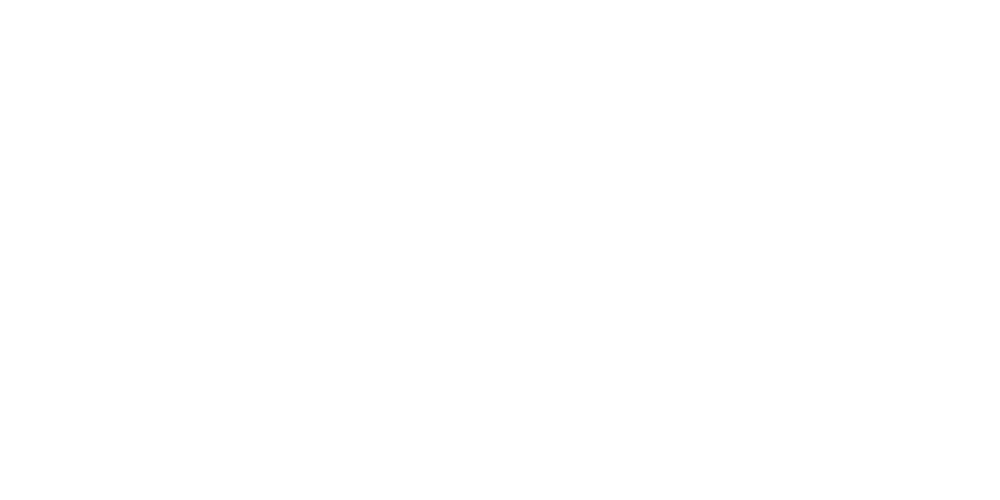

ValueError: num must be 1 <= num <= 16, not 0

In [130]:
#sign position change distribution
df = df_copy[df_copy['session'] == 'fiy4zmu5']
block_num = 4
practice_num = 2
block_label = ['Block 1: Greed(10,5,2)', 'Block 2: Fear(10,2,3)', 'Block 3: Greed(10,2,0.5)','Block 4: Greed/Fear Eqm(10,3,2)']
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
df = df.loc[(df['move'] == 1)]
# df = df.drop(df[(df['move'] == 1) & (df['if_freeze_now'] == 1)].index)
df = df.sort_values(by=['round_number','id_in_group', 'seconds'])
df['previous_strategies'] = df.groupby(['round_number','id_in_group'])['strategy'].shift()
df['signed_distance'] = df['strategy'] - df['previous_strategies']
%matplotlib notebook
plt.figure(figsize=(10,5))
for blk in range(block_num):
    df_block = df[(df['round_number']>blk*4) & (df['round_number']<(blk+1)*4+1)]
    sns.histplot(data=df_block['signed_distance'], kde=True, label=block_label[blk])


plt.xlabel('position change')
plt.xlim([-10,10])
plt.grid()
plt.legend()
plt.title('Distribution of position change in 4 blocks')
plt.show()
plt.savefig('signed_position_change.png', bbox_inches='tight')



<IPython.core.display.Javascript object>


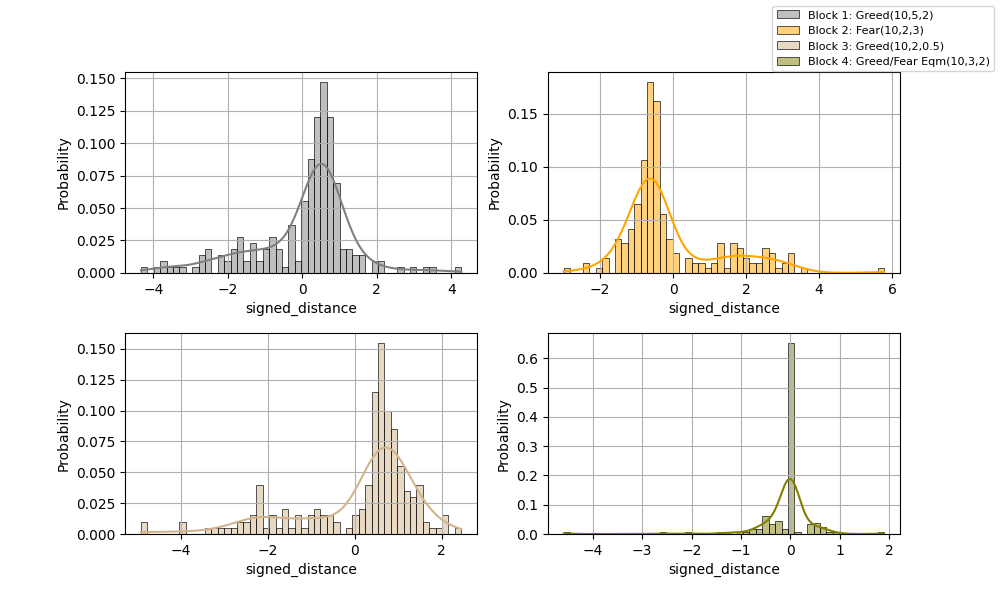

In [179]:
#separate sign position change distribution
df = df_copy[df_copy['session'] == 'fiy4zmu5']
df = df[(df['id_in_group']!= 2)&(df['id_in_group']!= 13)&(df['id_in_group']!= 7)&(df['id_in_group']!= 10)]
block_num = 4
practice_num = 2
block_label = ['Block 1: Greed(10,5,2)', 'Block 2: Fear(10,2,3)', 'Block 3: Greed(10,2,0.5)','Block 4: Greed/Fear Eqm(10,3,2)']
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
df = df[(df['round_number']== 4)|(df['round_number']== 8)|(df['round_number']== 12)|(df['round_number']== 16)]
df = df.loc[(df['move'] == 1)]
# df = df.drop(df[(df['move'] == 1) & (df['if_freeze_now'] == 1)].index)
df = df.sort_values(by=['round_number','id_in_group', 'seconds'])
df['previous_strategies'] = df.groupby(['round_number','id_in_group'])['strategy'].shift()
df['signed_distance'] = df['strategy'] - df['previous_strategies']
col_lst = ['gray', 'orange', 'tan', 'olive', 'green', 'lightseagreen', 'cyan', 'blue', 'purple', 'red']
%matplotlib notebook
rows = 2
cols = 2
fig = plt.figure(figsize=(5*cols,3*rows)) #single 5*3
fig.subplots_adjust(hspace=0.3, wspace=0.2)
for blk in range(1, rows*cols+1):
    ax = fig.add_subplot(rows, cols, blk)
    ax.grid()
    df_block = df[(df['round_number']>(blk-1)*4) & (df['round_number']<blk*4+1)]
    sns.histplot(data=df_block['signed_distance'],stat='probability', kde=True, bins=50, label=block_label[blk-1], color=col_lst[blk-1])
    

fig.legend(loc='upper right', fontsize=8)
# fig.suptitle('Distribution of position change in 4 blocks', y=0.92, fontsize=18)

# plt.xlabel('position change')
# # plt.xlim([-10,10])
# plt.grid()
# plt.legend()
# plt.title('Distribution of position change in 4 blocks')
plt.show()
plt.savefig('signed_position_change_clean.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


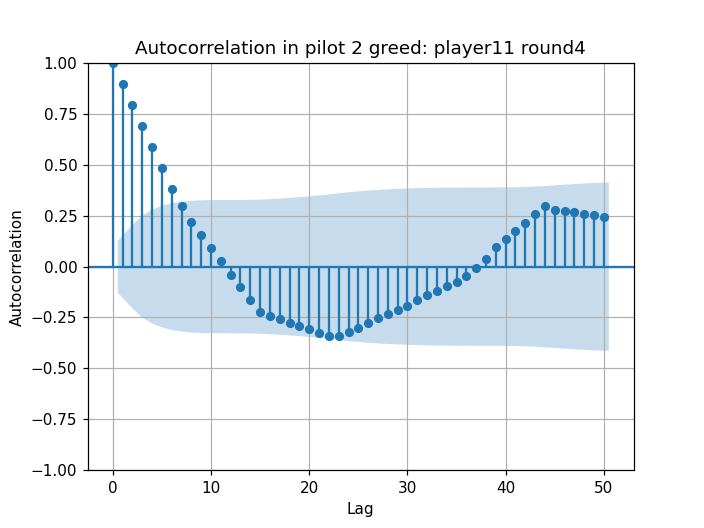

In [123]:
#test for serial correlation for round 4 player 11
%matplotlib notebook
df = df_copy[df_copy['session'] == 'fiy4zmu5']
df = df[(df['id_in_group']!= 2)&(df['id_in_group']!= 13)&(df['id_in_group']!= 7)&(df['id_in_group']!= 10)]
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
# df= df[(df['id_in_group'] == 11)&(df['round_number']==9)]
df= df[(df['id_in_group'] == 11)&(df['round_number']==4)]
player_id = int(df.iloc[0]['id_in_group'])
round_number = int(df.iloc[0]['round_number'])
df = df.sort_values(by=['round_number','id_in_group', 'seconds'])
# df = df[df['move'] == 1]
df = df[df['seconds']> 25]
df['previous_strategies'] = df.groupby(['round_number','id_in_group'])['strategy'].shift()
df['signed_distance'] = df['strategy'] - df['previous_strategies']
df.loc[df['signed_distance'] >0, 'signed_movement'] = 1
df.loc[df['signed_distance'] ==0, 'signed_movement'] = 0
df.loc[df['signed_distance'] <0, 'signed_movement'] = -1

df =df.dropna(subset=['previous_strategies'])
df
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(df['strategy'],lags=50)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()
plt.grid()
plt.title('Autocorrelation in pilot 2 greed: player' + str(player_id) + ' round' + str(round_number))
name = 'autocorr_player' + str(player_id) +'_round' + str(round_number)
plt.savefig(name+'.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


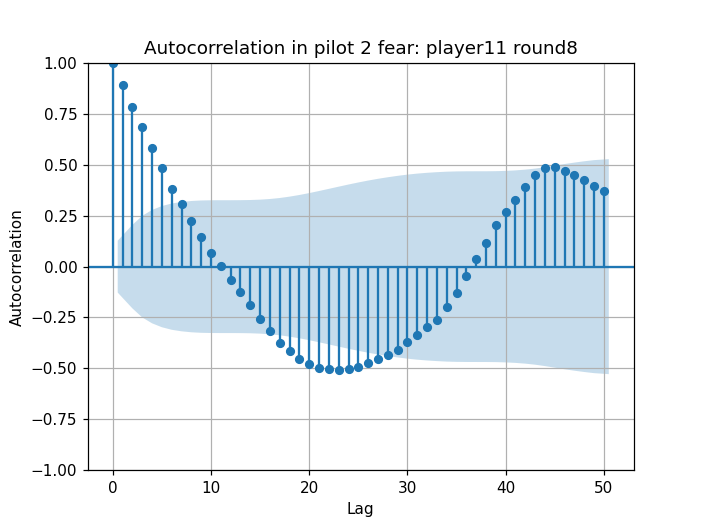

In [124]:
#test for serial correlation for round 8 player 11
%matplotlib notebook
df = df_copy[df_copy['session'] == 'fiy4zmu5']
df = df[(df['id_in_group']!= 2)&(df['id_in_group']!= 13)&(df['id_in_group']!= 7)&(df['id_in_group']!= 10)]
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
# df= df[(df['id_in_group'] == 11)&(df['round_number']==9)]
df= df[(df['id_in_group'] == 11)&(df['round_number']==8)]
player_id = int(df.iloc[0]['id_in_group'])
round_number = int(df.iloc[0]['round_number'])
df = df.sort_values(by=['round_number','id_in_group', 'seconds'])
# df = df[df['move'] == 1]
df = df[df['seconds']> 25]
df['previous_strategies'] = df.groupby(['round_number','id_in_group'])['strategy'].shift()
df
df['signed_distance'] = df['strategy'] - df['previous_strategies']
df.loc[df['signed_distance'] >0, 'signed_movement'] = 1
df.loc[df['signed_distance'] ==0, 'signed_movement'] = 0
df.loc[df['signed_distance'] <0, 'signed_movement'] = -1
df
df =df.dropna(subset=['previous_strategies'])
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(df['strategy'],lags=50)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()
plt.grid()
plt.title('Autocorrelation in pilot 2 fear: player' + str(player_id) + ' round' + str(round_number))
name = 'autocorr_player' + str(player_id) +'_round' + str(round_number)
plt.savefig(name+'.png', bbox_inches='tight')


<IPython.core.display.Javascript object>


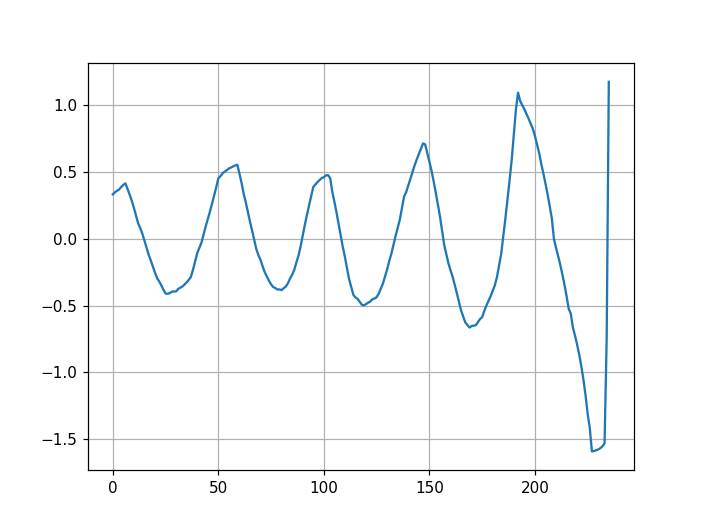

In [106]:
#test for cross correlation for round 9 &13 player 11 & 5
%matplotlib notebook
df = df_copy[df_copy['session'] == 'fiy4zmu5']
df = df[(df['id_in_group']!= 2)&(df['id_in_group']!= 13)&(df['id_in_group']!= 7)&(df['id_in_group']!= 10)]
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
df = df.sort_values(by=['round_number','id_in_group', 'seconds'])
# df = df[df['move'] == 1]
df = df[df['seconds']> 25]
df['previous_strategies'] = df.groupby(['round_number','id_in_group'])['strategy'].shift()
df
df['signed_distance'] = df['strategy'] - df['previous_strategies']
df.loc[df['signed_distance'] >0, 'signed_movement'] = 1
df.loc[df['signed_distance'] ==0, 'signed_movement'] = 0
df.loc[df['signed_distance'] <0, 'signed_movement'] = -1
df =df.dropna(subset=['previous_strategies'])

df_tem = df[(df['id_in_group'] == 11)&(df['round_number']==8)]
strategy1 = df_tem['strategy']
df_tem = df[(df['id_in_group'] == 12)&(df['round_number']==8)]
strategy2 = df_tem['strategy']
player_id = int(df_tem.iloc[0]['id_in_group'])
round_number = int(df_tem.iloc[0]['round_number'])
import statsmodels.api as sm
#calculate cross correlation

plt.plot(sm.tsa.stattools.ccf(strategy1, strategy2, adjusted=True))
plt.grid()

<IPython.core.display.Javascript object>


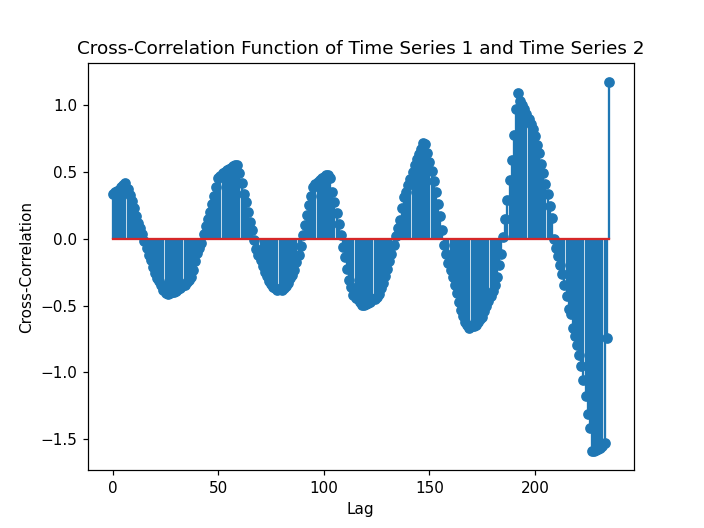

In [56]:
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
%matplotlib notebook
# Generate two example time series
time_series1 = strategy1
time_series2 = strategy2

# Calculate the cross-correlation function using statsmodels
cross_correlation = sm.tsa.ccf(time_series1, time_series2)

# Plot the cross-correlation function
plt.stem(cross_correlation, use_line_collection=True)
plt.title('Cross-Correlation Function of Time Series 1 and Time Series 2')
plt.xlabel('Lag')
plt.ylabel('Cross-Correlation')
plt.show()

<IPython.core.display.Javascript object>


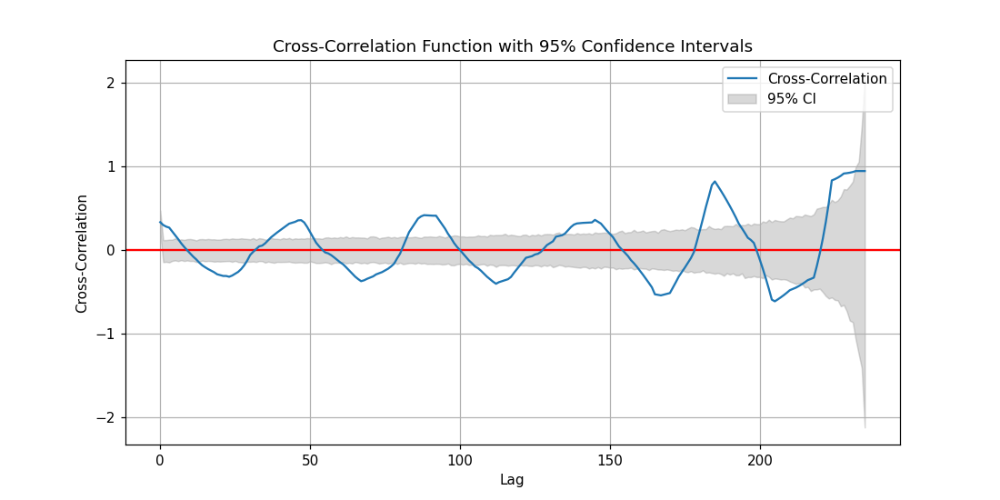

In [114]:
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
%matplotlib notebook
# Generate two example time series
np.random.seed(42)

num_points = 100
seasonal_period = 12  # Monthly data, for example

# Generate an array with a seasonal trend
time = np.arange(num_points)
seasonal_trend = 5 * np.sin(2 * np.pi * time / seasonal_period) + np.random.normal(0, 1, num_points)

# time_series1 = seasonal_trend
# time_series2 = time_series1 + 2 * np.random.randn(100)

time_series1 = np.array(strategy2)
time_series2 = np.array(strategy1)

# Number of bootstrap samples
num_samples = 1000

# Calculate the cross-correlation function using statsmodels
cross_correlation = sm.tsa.ccf(time_series1, time_series2)

# Create an array to store bootstrap samples
bootstrap_samples = np.zeros((num_samples, len(cross_correlation)))

# Perform bootstrap resampling
for i in range(num_samples):
    # Randomly sample with replacement
    idx = np.random.choice(len(time_series1), len(time_series1), replace=True)
    # Calculate cross-correlation for the bootstrap sample
    bootstrap_samples[i, :] = sm.tsa.ccf(time_series1[idx], time_series2[idx])

# Calculate confidence intervals
lower_bound = np.percentile(bootstrap_samples, 2.5, axis=0)
upper_bound = np.percentile(bootstrap_samples, 97.5, axis=0)

# Plot the cross-correlation function with shaded confidence interval
plt.figure(figsize=(10,5))
# plt.stem(cross_correlation, use_line_collection=True)
plt.axhline(y = 0, color = 'r', linestyle = '-') 
plt.plot(cross_correlation, label='Cross-Correlation')

plt.fill_between(range(len(cross_correlation)), lower_bound, upper_bound, color='gray', alpha=0.3, label='95% CI')
# plt.plot(time_series1)
# plt.plot(time_series2)
plt.title('Cross-Correlation Function with 95% Confidence Intervals')
plt.xlabel('Lag')
plt.ylabel('Cross-Correlation')
plt.legend()
plt.grid()
plt.show()
plt.savefig('cross_correlation_round8_player11_12.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


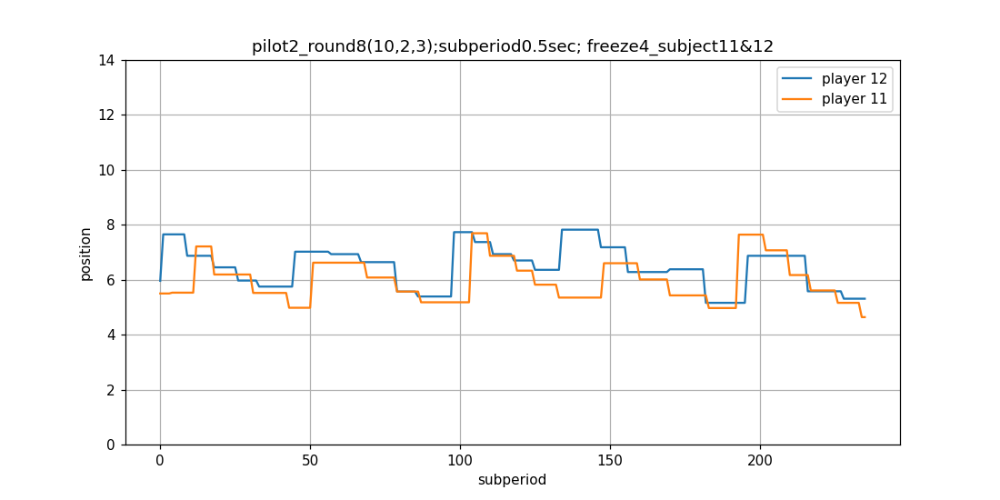

In [115]:
%matplotlib notebook
plt.figure(figsize=(10,5))
# plt.stem(cross_correlation, use_line_collection=True)
# plt.axhline(y = 0, color = 'r', linestyle = '-') 
# plt.plot(cross_correlation, label='Cross-Correlation')

# plt.fill_between(range(len(cross_correlation)), lower_bound, upper_bound, color='gray', alpha=0.3, label='95% CI')
plt.plot(time_series1, label='player 12')
plt.plot(time_series2, label='player 11')
plt.title('pilot2_round8(10,2,3);subperiod0.5sec; freeze4_subject11&12')
plt.ylim([0,14])
plt.xlabel('subperiod')
plt.ylabel('position')
plt.legend()
plt.grid()
plt.show()
plt.savefig('position_over_subperiod_round8_player11_12.png', bbox_inches='tight')

In [75]:
print(time_series1, time_series2)

[  49.6714153   -13.82643012   64.76885381  152.30298564  -23.41533747
  -23.41369569  157.92128155   76.74347292  -46.94743859   54.25600436
  -46.34176928  -46.57297536   24.19622716 -191.32802447 -172.49178325
  -56.22875292 -101.28311203   31.42473326  -90.80240755 -141.23037013
  146.56487689  -22.57763005    6.75282047 -142.47481862  -54.43827245
   11.09225897 -115.09935774   37.56980183  -60.06386899  -29.16937498
  -60.17066122  185.22781845   -1.34972247 -105.7710929    82.25449121
 -122.084365     20.8863595  -195.96701239 -132.81860489   19.68612359
   73.846658     17.13682812  -11.56482824  -30.11036956 -147.85219904
  -71.98442084  -46.0638771   105.71222262   34.36182896 -176.30401554
   32.40839694  -38.50822804  -67.69220003   61.16762888  103.09995225
   93.12801191  -83.92175232  -30.92123759   33.12634314   97.55451271
  -47.91742378  -18.56589767 -110.6334974  -119.62066241   81.25258224
  135.62400286   -7.20101216  100.35328979   36.1636025   -64.51197546
   36.

[5.97 7.66 7.66 7.66 7.66 7.66 7.66 7.66 7.66 6.88 6.88 6.88 6.88 6.88
 6.88 6.88 6.88 6.88 6.46 6.46 6.46 6.46 6.46 6.46 6.46 6.46 5.98 5.98
 5.98 5.98 5.98 5.98 5.98 5.76 5.76 5.76 5.76 5.76 5.76 5.76 5.76 5.76
 5.76 5.76 5.76 7.03 7.03 7.03 7.03 7.03 7.03 7.03 7.03 7.03 7.03 7.03
 7.03 6.94 6.94 6.94 6.94 6.94 6.94 6.94 6.94 6.94 6.94 6.65 6.65 6.65
 6.65 6.65 6.65 6.65 6.65 6.65 6.65 6.65 6.65 5.58 5.58 5.58 5.58 5.58
 5.58 5.58 5.4  5.4  5.4  5.4  5.4  5.4  5.4  5.4  5.4  5.4  5.4  5.4
 7.74 7.74 7.74 7.74 7.74 7.74 7.74 7.38 7.38 7.38 7.38 7.38 7.38 6.94
 6.94 6.94 6.94 6.94 6.94 6.94 6.71 6.71 6.71 6.71 6.71 6.71 6.71 6.37
 6.37 6.37 6.37 6.37 6.37 6.37 6.37 6.37 7.83 7.83 7.83 7.83 7.83 7.83
 7.83 7.83 7.83 7.83 7.83 7.83 7.83 7.19 7.19 7.19 7.19 7.19 7.19 7.19
 7.19 7.19 6.29 6.29 6.29 6.29 6.29 6.29 6.29 6.29 6.29 6.29 6.29 6.29
 6.29 6.29 6.39 6.39 6.39 6.39 6.39 6.39 6.39 6.39 6.39 6.39 6.39 6.39
 5.17 5.17 5.17 5.17 5.17 5.17 5.17 5.17 5.17 5.17 5.17 5.17 5.17 5.17
 6.88 6

<IPython.core.display.Javascript object>


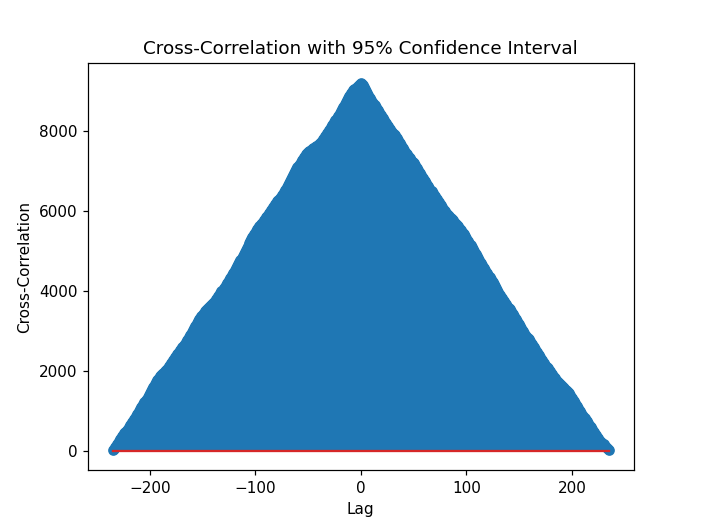

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import correlate
from scipy.stats import norm
%matplotlib notebook
# Generate two example arrays
array1 = np.array(strategy2)
array2 = np.array(strategy1)
print(array1, array2)
# Compute cross-correlation using scipy's correlate function
cross_correlation = correlate(array1, array2, mode='full')

# Calculate lags for x-axis
lags = np.arange(-(len(array1)-1), len(array1))

# Calculate the standard error of the mean for the cross-correlation
num_samples = len(array1)
confidence_level = 0.95
z_score = norm.ppf((1 + confidence_level) / 2)
standard_error = np.sqrt((1 + 2 * np.correlate(array1, array1, mode='full')) / num_samples)

# Calculate confidence interval
confidence_interval = z_score * standard_error

# Plot the cross-correlation with confidence interval
plt.stem(lags, cross_correlation, use_line_collection=True)
plt.fill_between(lags, cross_correlation - confidence_interval, cross_correlation + confidence_interval, alpha=0.2, color='red')
plt.title('Cross-Correlation with 95% Confidence Interval')
plt.xlabel('Lag')
plt.ylabel('Cross-Correlation')
plt.show()

<IPython.core.display.Javascript object>


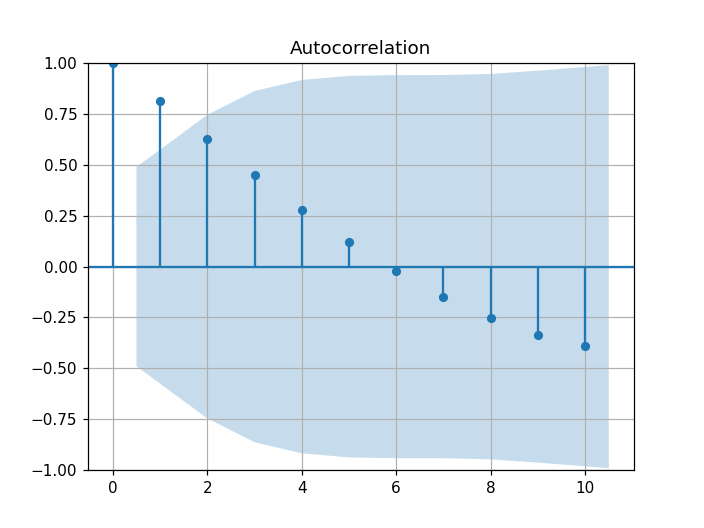

In [31]:
%matplotlib notebook
a = [10,9,8,7,6,5,4,3,2,1,0,-1,-2,-3,-4,-5]
a = np.array(a) * (-1)
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(a,lags=10)
plt.show()
plt.grid()

In [15]:
df

,session,subperiod,period_length,xmax,xmin,ymax,ymin,lambda,gamma,rho,...,payoff,multiplied_payoff,move,remaining_freeze_period,if_freeze_next,if_freeze_now,bug,previous_strategies,signed_distance,signed_movement


<IPython.core.display.Javascript object>


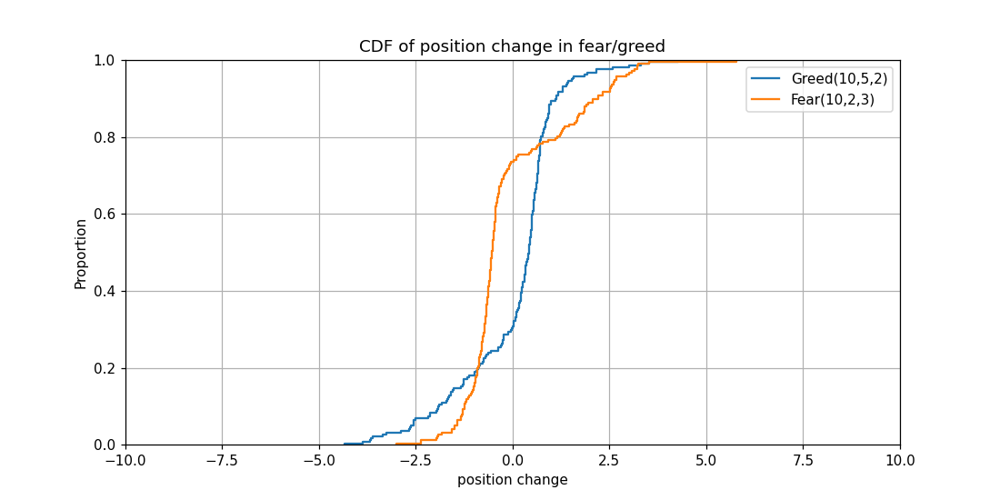

In [11]:
#sign position change distribution cdf
df = df_copy[df_copy['session'] == 'fiy4zmu5']
df = df[(df['id_in_group']!= 2)&(df['id_in_group']!= 13)&(df['id_in_group']!= 7)&(df['id_in_group']!= 10)]
block_num = 2
practice_num = 2
block_label = ['Greed(10,5,2)', 'Fear(10,2,3)']
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
df = df[(df['round_number']== 4)|(df['round_number']== 8)|(df['round_number']== 12)|(df['round_number']== 16)]
df = df.loc[(df['move'] == 1)]
# df = df.drop(df[(df['move'] == 1) & (df['if_freeze_now'] == 1)].index)
df = df.sort_values(by=['round_number','id_in_group', 'seconds'])
df['previous_strategies'] = df.groupby(['round_number','id_in_group'])['strategy'].shift()
df['signed_distance'] = df['strategy'] - df['previous_strategies']

stat = "proportion"  # or count

%matplotlib notebook
plt.figure(figsize=(10,5))
for blk in range(block_num):
    df_block = df[(df['round_number']>blk*4) & (df['round_number']<(blk+1)*4+1)]
#     sns.histplot(df_block['signed_distance'], stat=stat, cumulative=True, alpha=.4)
    sns.ecdfplot(df_block['signed_distance'], stat=stat, label=block_label[blk])


plt.xlabel('position change')
plt.xlim([-10,10])
plt.grid()
plt.legend()
plt.title('CDF of position change in fear/greed')
plt.show()
plt.savefig('cdf_signed_position_change_fear_greed.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


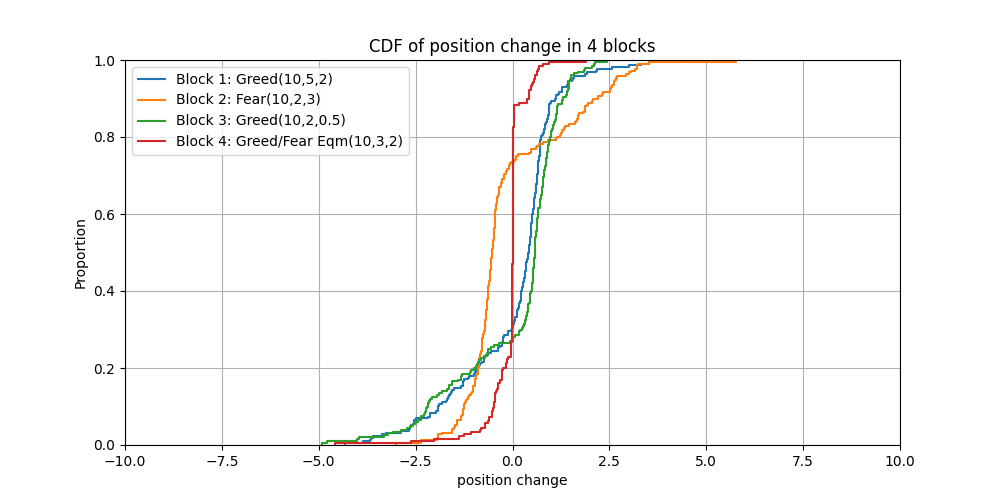

In [180]:
#sign position change distribution cdf
df = df_copy[df_copy['session'] == 'fiy4zmu5']
df = df[(df['id_in_group']!= 2)&(df['id_in_group']!= 13)&(df['id_in_group']!= 7)&(df['id_in_group']!= 10)]
block_num = 4
practice_num = 2
block_label = ['Block 1: Greed(10,5,2)', 'Block 2: Fear(10,2,3)', 'Block 3: Greed(10,2,0.5)','Block 4: Greed/Fear Eqm(10,3,2)']
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
df = df[(df['round_number']== 4)|(df['round_number']== 8)|(df['round_number']== 12)|(df['round_number']== 16)]
df = df.loc[(df['move'] == 1)]
# df = df.drop(df[(df['move'] == 1) & (df['if_freeze_now'] == 1)].index)
df = df.sort_values(by=['round_number','id_in_group', 'seconds'])
df['previous_strategies'] = df.groupby(['round_number','id_in_group'])['strategy'].shift()
df['signed_distance'] = df['strategy'] - df['previous_strategies']

stat = "proportion"  # or count

%matplotlib notebook
plt.figure(figsize=(10,5))
for blk in range(block_num):
    df_block = df[(df['round_number']>blk*4) & (df['round_number']<(blk+1)*4+1)]
#     sns.histplot(df_block['signed_distance'], stat=stat, cumulative=True, alpha=.4)
    sns.ecdfplot(df_block['signed_distance'], stat=stat, label=block_label[blk])


plt.xlabel('position change')
plt.xlim([-10,10])
plt.grid()
plt.legend()
plt.title('CDF of position change in 4 blocks')
plt.show()
plt.savefig('cdf_signed_position_change_clean.png', bbox_inches='tight')


In [168]:
from scipy import stats
from scipy.stats import skew
df = df_copy[df_copy['session'] == 'fiy4zmu5']
block_num = 4
practice_num = 2
block_label = ['Block 1: Greed(10,5,2)', 'Block 2: Fear(10,2,3)', 'Block 3: Greed(10,2,0.5)','Block 4: Greed/Fear Eqm(10,3,2)']
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
df = df.loc[(df['move'] == 1)]
# df = df.drop(df[(df['move'] == 1) & (df['if_freeze_now'] == 1)].index)
df = df.sort_values(by=['round_number','id_in_group', 'seconds'])
df['previous_strategies'] = df.groupby(['round_number','id_in_group'])['strategy'].shift()
df['signed_distance'] = df['strategy'] - df['previous_strategies']

for blk in range(block_num):
    df_block = df[(df['round_number']>blk*4) & (df['round_number']<(blk+1)*4+1)]
    x = df_block['signed_distance'].to_numpy()
    x =x[~np.isnan(x)]
    print(len(x))
    skw = skew(x)
    res = stats.skewtest(x)
    print('block', blk)
    print('skewness:',round(skw,2))
    print('z score:',round(res.statistic,2))
    print('p value:',round(res.pvalue,5))

1335
block 0
skewness: -0.19
z score: -2.83
p value: 0.00463
1263
block 1
skewness: 0.88
z score: 11.18
p value: 0.0
1322
block 2
skewness: -1.64
z score: -17.73
p value: 0.0
1066
block 3
skewness: -1.18
z score: -12.8
p value: 0.0


In [171]:
mu, sigma = 2, 0.1 # mean and standard deviation
s = np.random.normal(mu, sigma, 10)
skw = skew(s)
res = stats.skewtest(s)
print('skewness:',round(skw,2))
print('z score:',round(res.statistic,2))
print('p value:',round(res.pvalue,2))

skewness: 0.48
z score: 0.84
p value: 0.4


<IPython.core.display.Javascript object>


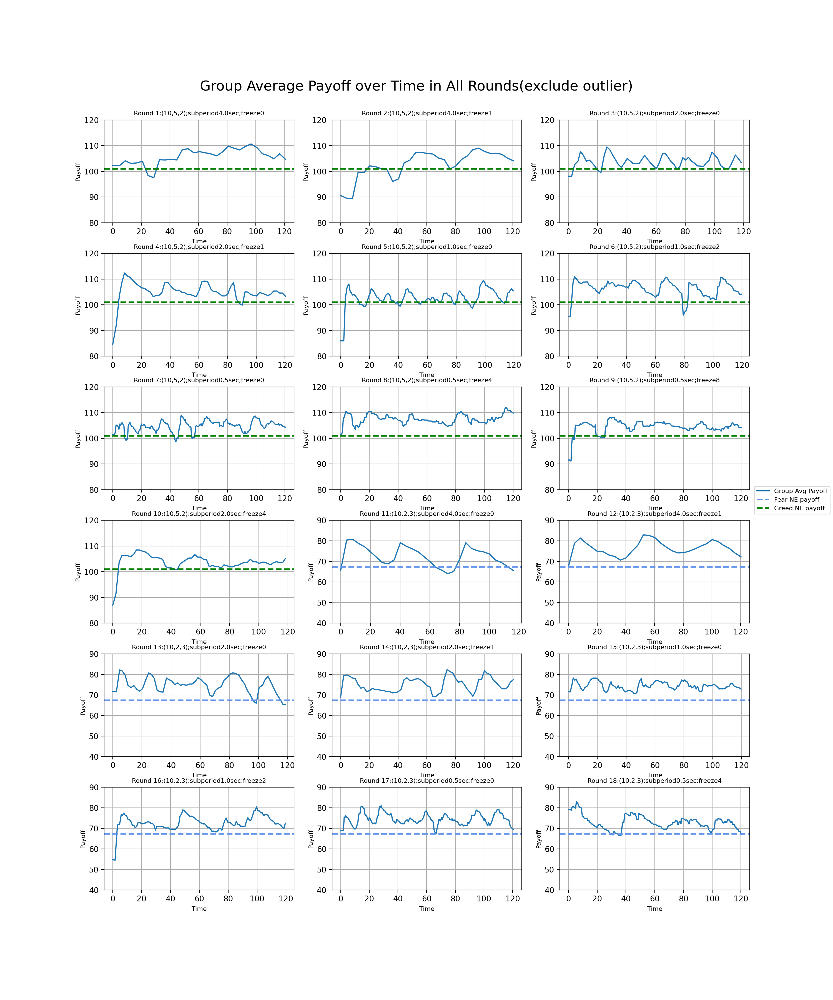

[<matplotlib.lines.Line2D object at 0x163eda460>, <matplotlib.lines.Line2D object at 0x143a25eb0>, <matplotlib.lines.Line2D object at 0x163d386d0>] ['Group Avg Payoff', 'Fear NE payoff', 'Greed NE payoff']


In [55]:
#not use
#group average over time in all rounds (exclude outlier )
df = df_copy[df_copy['strategy'] < 100]
df = df.drop(df[(df['round_number'] < 11) & (df['id_in_group'] == 2)].index)
handles2 = []
labels2 = []
# df = df[(df['id_in_group']==1)|(df['id_in_group']>3)]
freeze_period_list = [0,1,0,1,0,2,0,4,8,4,0,1,0,1,0,2,0,4]
ylim = [[80,120], [40,90]]
# yticks = [[5,19], [0,14]]
NE_payoff = [101, 67.33]
# player_label = list(range(1,10))
rows = 6
cols = 3
fig = plt.figure(figsize=(5*cols,3*rows)) #single 5*3
fig.subplots_adjust(hspace=0.3, wspace=0.2)
for i in range(1, rows*cols+1):
    df_round = df[df['round_number']==i]
#     player_label = df_round.id_in_group.unique()
#     player_label.sort()
    subperiod = df_round.iloc[0]['subperiod']
    lam = int(df_round.iloc[0]['lambda'])
    gam = int(df_round.iloc[0]['gamma'])
    rho = int(df_round.iloc[0]['rho'])
    freeze = freeze_period_list[i-1]
    df_round = df_round.groupby('seconds')['payoff'].mean()
#     df_round = df_round.reset_index()
    title = 'Round ' +str(i) + ':'+'('+str(lam) +','+str(gam) +','+str(rho) +');'+ 'subperiod' + str(subperiod) + 'sec;freeze'+str(freeze)
    ax = fig.add_subplot(rows, cols, i)
    ax.plot(df_round, label='Group Avg Payoff')
    ax.set_title(title, fontsize=8)
    ax.set_xlabel('Time', fontsize=8)
    ax.set_ylabel('Payoff', fontsize=8)
    if gam == 5:
        ax.set_ylim(ylim[0])
#         ax.set_yticks(yticks[0])
        ax.axhline(y=NE_payoff[0], color='green', linestyle='--',linewidth=2, label='Greed NE payoff')
        handles1, labels1 = ax.get_legend_handles_labels()
    else:
        ax.set_ylim(ylim[1])
#         ax.set_yticks(yticks[1])
        ax.axhline(y=NE_payoff[1], color='cornflowerblue', linestyle='--',linewidth=2, label='Fear NE payoff')
        handles2, labels2 = ax.get_legend_handles_labels()
    ax.grid()
handles2.append(handles1[-1])
labels2.append(labels1[-1])
print(handles2, labels2)
fig.legend(handles2, labels2, loc='center right', fontsize=8)
fig.suptitle('Group Average Payoff over Time in All Rounds(exclude outlier)', y=0.92, fontsize=18)
plt.show()
plt.savefig('group_avg_payoff_over_time_all_without_outlier.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


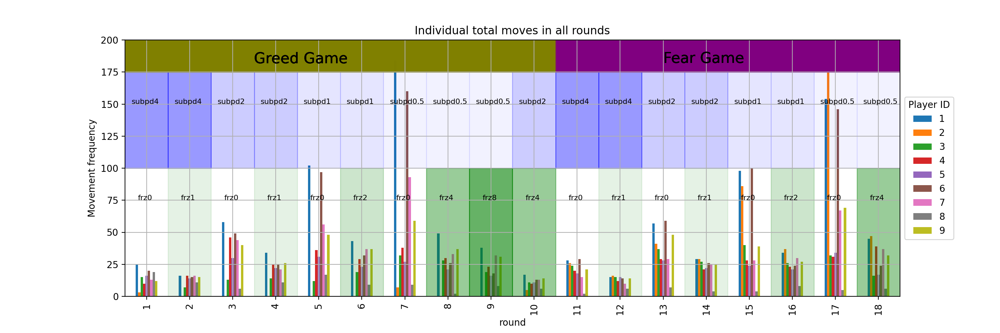

In [218]:
#not use
#generate move frequency
freeze_period_list = [0,1,0,1,0,2,0,4,8,4,0,1,0,1,0,2,0,4]
subperiod_list = [4,4,2,2,1,1,0.5,0.5,0.5,2,4,4,2,2,1,1,0.5,0.5]
color_list = [0,1,0,1,0,2,0,4,6,4,0,1,0,1,0,2,0,4]
df = df_copy[df_copy['strategy'] < 100]
df_groupby_id_round = df.groupby(['round_number', 'id_in_group']).sum()
df_groupby_id_round = df_groupby_id_round.reset_index()
df_bar = df_groupby_id_round[['round_number', 'id_in_group','move']]
df_bar = df_bar.pivot(index='round_number', columns='id_in_group', values='move')
# as_list = df_bar.index.tolist()
# new_index = []
# for i in range(18):
#     ele = str(as_list[i]) + ' (Freeze' + str(freeze_period_list[i])+ ')'
#     new_index.append(ele)
# df_bar.index = new_index
%matplotlib notebook
df_bar.plot.bar(figsize=(15, 5))
for i in range(18):
    plt.text(i-0.2, 75, 'frz'+str(freeze_period_list[i]), fontsize = 8)
    plt.text(i-0.35, 150, 'subpd'+str(subperiod_list[i]), fontsize = 8)
    plt.axvspan(xmin=i-0.5, xmax=i+0.5, alpha=color_list[i]/10, color='g', ymin=0, ymax=1/2)
    plt.axvspan(xmin=i-0.5, xmax=i+0.5, alpha=subperiod_list[i]/10, color='b', ymin=1/2, ymax=7/8)
    plt.text(2.5, 182, 'Greed Game', fontsize = 16)
    plt.text(12, 182, 'Fear Game', fontsize = 16)
    plt.axvspan(xmin=-0.5, xmax=9.5, alpha=0.4, color='olive', ymin=7/8, ymax=1)
    plt.axvspan(xmin=9.5, xmax=17.5, alpha=0.4, color='purple', ymin=7/8, ymax=1)
plt.ylim([0,200])
plt.xlabel('round')
plt.ylabel('Movement frequency')
plt.title('Individual total moves in all rounds')
plt.grid()
plt.legend(title='Player ID', loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()
plt.savefig('move_frequency_all.png', bbox_inches='tight')

<IPython.core.display.Javascript object>


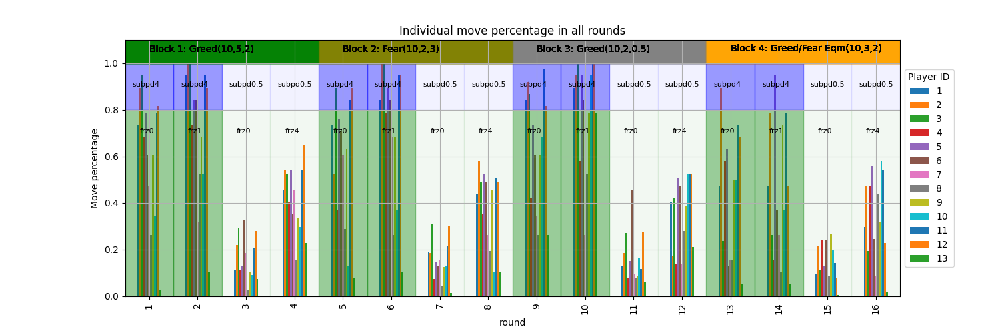

In [85]:
#move percentage in all round
%matplotlib notebook
df = df_copy[df_copy['session'] == 'fiy4zmu5']
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
ylim = [[50,125], [25,100], [0,160], [25,125]]
# yticks = [[5,19], [0,14]]
NE_support = [[10,14], [4,10], [10,16], [8,12]]
shade_color = ['g', 'olive', 'grey', 'orange']
NE_payoff = [101, 67.33, 101, 101]
freeze_period_list = [0,1,0,4,0,1,0,4,0,1,0,4,0,1,0,4]
subperiod_list = [4,4,0.5,0.5,4,4,0.5,0.5,4,4,0.5,0.5,4,4,0.5,0.5]
color_list = [0,1,0,1,0,2,0,4,6,4,0,1,0,1,0,2,0,4]
block_label = ['Block 1: Greed(10,5,2)', 'Block 2: Fear(10,2,3)', 'Block 3: Greed(10,2,0.5)','Block 4: Greed/Fear Eqm(10,3,2)']
df['count'] = 1
df_groupby_id_round = df.groupby(['round_number', 'id_in_group']).sum()
df_groupby_id_round = df_groupby_id_round.reset_index()



# for i in range(16):
#     df_groupby_id_round.loc[df_groupby_id_round['round_number']==i+1, 'freeze_time'] = freeze_period_list[i]
df_groupby_id_round['freeze_time'] = df_groupby_id_round['freeze_period']/df_groupby_id_round['count']
df_groupby_id_round['potential_move'] = df_groupby_id_round['count']/(df_groupby_id_round['freeze_time']+1)

df_groupby_id_round.potential_move = df_groupby_id_round.potential_move.round()
# df_groupby_id_round['possible_move'] = df_groupby_id_round['move'] + df_groupby_id_round['if_self_freeze']
# df_groupby_id_round['move_density'] = df_groupby_id_round['move']/df_groupby_id_round['possible_move']
df_groupby_id_round['move_density'] = df_groupby_id_round['move']/df_groupby_id_round['potential_move']
df_bar = df_groupby_id_round[['round_number', 'id_in_group','move_density']]
df_bar = df_bar.pivot(index='round_number', columns='id_in_group', values='move_density')
# as_list = df_bar.index.tolist()
# new_index = []
# for i in range(18):
#     ele = str(as_list[i]) + ' (Freeze' + str(freeze_period_list[i])+ ')'
#     new_index.append(ele)
# df_bar.index = new_index
df_bar.plot.bar(figsize=(15, 5))
for i in range(16):
    plt.text(i-0.2, 0.7, 'frz'+str(freeze_period_list[i]), fontsize = 8)
    plt.text(i-0.35, 0.9, 'subpd'+str(subperiod_list[i]), fontsize = 8)
    plt.axvspan(xmin=i-0.5, xmax=i+0.5, alpha=subperiod_list[i]/10, color='g', ymin=0, ymax=8/11)
    plt.axvspan(xmin=i-0.5, xmax=i+0.5, alpha=subperiod_list[i]/10, color='b', ymin=8/11, ymax=10/11)
    plt.text(0, 1.05, block_label[0], fontsize = 10)
    plt.text(4, 1.05, block_label[1], fontsize = 10)
    plt.text(8, 1.05, block_label[2], fontsize = 10)
    plt.text(12, 1.05, block_label[3], fontsize = 10)
    plt.axvspan(xmin=-0.5, xmax=3.5, alpha=0.2, color=shade_color[0], ymin=10/11, ymax=1)
    plt.axvspan(xmin=3.5, xmax=7.5, alpha=0.2, color=shade_color[1], ymin=10/11, ymax=1)
    plt.axvspan(xmin=7.5, xmax=11.5, alpha=0.2, color=shade_color[2], ymin=10/11, ymax=1)
    plt.axvspan(xmin=11.5, xmax=15.5, alpha=0.2, color=shade_color[3], ymin=10/11, ymax=1)
plt.ylim([0,1.1])
plt.xlabel('round')
plt.ylabel('Move percentage')
plt.title('Individual move percentage in all rounds')
plt.grid()
plt.legend(title='Player ID', loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()
plt.savefig('move_percent_all.png', bbox_inches='tight')

/var/folders/15/djmbdtz95_34fcrr8nrcvk_40000gn/T/ipykernel_3579/3741618767.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['if_self_freeze'] = 0


<IPython.core.display.Javascript object>


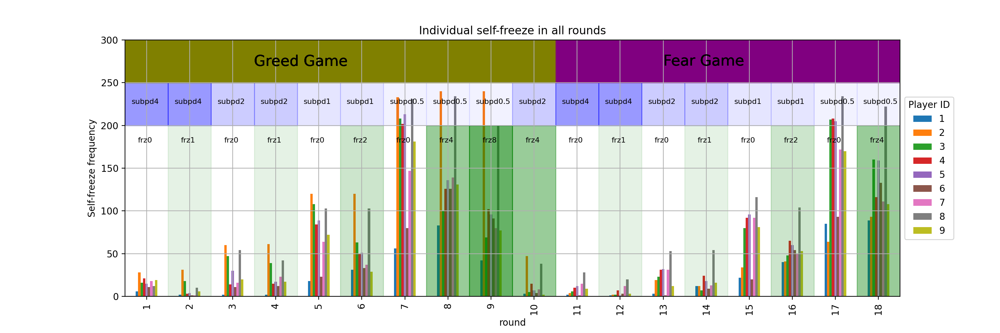

In [217]:
#not use
#generate if self freeze
freeze_period_list = [0,1,0,1,0,2,0,4,8,4,0,1,0,1,0,2,0,4]
subperiod_list = [4,4,2,2,1,1,0.5,0.5,0.5,2,4,4,2,2,1,1,0.5,0.5]
color_list = [0,1,0,1,0,2,0,4,6,4,0,1,0,1,0,2,0,4]
df = df_copy[df_copy['strategy'] < 100]

df['if_self_freeze'] = 0
df.loc[(df['move']==0) & (df['if_freeze_now']==0), 'if_self_freeze'] = 1
df_groupby_id_round = df.groupby(['round_number', 'id_in_group']).sum()
df_groupby_id_round = df_groupby_id_round.reset_index()
df_bar = df_groupby_id_round[['round_number', 'id_in_group','if_self_freeze']]
df_bar = df_bar.pivot(index='round_number', columns='id_in_group', values='if_self_freeze')
# as_list = df_bar.index.tolist()
# new_index = []
# for i in range(18):
#     ele = str(as_list[i]) + ' (Freeze' + str(freeze_period_list[i])+ ')'
#     new_index.append(ele)
# df_bar.index = new_index
%matplotlib notebook
df_bar.plot.bar(figsize=(15, 5))
for i in range(18):
    plt.text(i-0.2, 180, 'frz'+str(freeze_period_list[i]), fontsize = 8)
    plt.text(i-0.35, 225, 'subpd'+str(subperiod_list[i]), fontsize = 8)
    plt.axvspan(xmin=i-0.5, xmax=i+0.5, alpha=color_list[i]/10, color='g', ymin=0, ymax=2/3)
    plt.axvspan(xmin=i-0.5, xmax=i+0.5, alpha=subperiod_list[i]/10, color='b', ymin=2/3, ymax=5/6)
    plt.text(2.5, 270, 'Greed Game', fontsize = 16)
    plt.text(12, 270, 'Fear Game', fontsize = 16)
    plt.axvspan(xmin=-0.5, xmax=9.5, alpha=0.4, color='olive', ymin=5/6, ymax=1)
    plt.axvspan(xmin=9.5, xmax=17.5, alpha=0.4, color='purple', ymin=5/6, ymax=1)
plt.ylim([0,300])
plt.xlabel('round')
plt.ylabel('Self-freeze frequency')
plt.title('Individual self-freeze in all rounds')
plt.grid()
plt.legend(title='Player ID', loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()
plt.savefig('self_freeze_all.png', bbox_inches='tight')

In [17]:
#not use
#self freeze
freeze_period_list = [0,1,0,1,0,2,0,4,8,4,0,1,0,1,0,2,0,4]
subperiod_list = [4,4,2,2,1,1,0.5,0.5,0.5,2,4,4,2,2,1,1,0.5,0.5]
color_list = [0,1,0,1,0,2,0,4,6,4,0,1,0,1,0,2,0,4]
df = df_copy[df_copy['strategy'] < 100]
# df = df.drop(df[(df['round_number'] < 11) & (df['id_in_group'] == 2)].index)
df['count'] = 1
# df['if_self_freeze'] = 0
# df.loc[(df['move']==0) & (df['if_freeze_now']==0), 'if_self_freeze'] = 1
df_groupby_id_round = df.groupby(['round_number', 'id_in_group']).sum()
df_groupby_id_round = df_groupby_id_round.reset_index()
df_groupby_id_round['subperiod_copy'] = df_groupby_id_round['subperiod']/df_groupby_id_round['count']
for i in range(18):
    df_groupby_id_round.loc[df_groupby_id_round['round_number']==i+1, 'freeze_time'] = freeze_period_list[i]
df_groupby_id_round['potential_move'] = df_groupby_id_round['count']
df_groupby_id_round.loc[df_groupby_id_round['freeze_time']>0, 'potential_move'] = df_groupby_id_round['count']/(df_groupby_id_round['freeze_time']+1)

# df_groupby_id_round['possible_move'] = df_groupby_id_round['move'] + df_groupby_id_round['if_self_freeze']
# df_groupby_id_round['self_freeze_density'] = df_groupby_id_round['if_self_freeze']/df_groupby_id_round['possible_move']
df_groupby_id_round['move_density'] = df_groupby_id_round['move']/df_groupby_id_round['potential_move']
# df_bar = df_groupby_id_round[['round_number', 'id_in_group','self_freeze_density']]
# df_bar = df_bar.pivot(index='round_number', columns='id_in_group', values='self_freeze_density')
df_bar = df_groupby_id_round[['round_number', 'id_in_group','move_density']]
df_bar = df_bar.pivot(index='round_number', columns='id_in_group', values='move_density')

# as_list = df_bar.index.tolist()
# new_index = []
# for i in range(18):
#     ele = str(as_list[i]) + ' (Freeze' + str(freeze_period_list[i])+ ')'
#     new_index.append(ele)
# df_bar.index = new_index
# %matplotlib notebook
# df_bar.plot.bar(figsize=(15, 5))
# for i in range(18):
#     plt.text(i-0.2, 0.7, 'frz'+str(freeze_period_list[i]), fontsize = 8)
#     plt.text(i-0.35, 0.9, 'subpd'+str(subperiod_list[i]), fontsize = 8)
#     plt.axvspan(xmin=i-0.5, xmax=i+0.5, alpha=color_list[i]/10, color='g', ymin=0, ymax=2/3)
#     plt.axvspan(xmin=i-0.5, xmax=i+0.5, alpha=subperiod_list[i]/10, color='b', ymin=2/3, ymax=5/6)
#     plt.text(2.5, 1.1, 'Greed Game', fontsize = 16)
#     plt.text(12, 1.1, 'Fear Game', fontsize = 16)
#     plt.axvspan(xmin=-0.5, xmax=9.5, alpha=0.4, color='olive', ymin=5/6, ymax=1)
#     plt.axvspan(xmin=9.5, xmax=17.5, alpha=0.4, color='purple', ymin=5/6, ymax=1)
# plt.ylim([0,1.2])
# plt.xlabel('round')
# plt.ylabel('Self-freeze density')
# plt.title('Individual self freeze density in all rounds')
# plt.grid()
# plt.legend(title='Player ID', loc='center left', bbox_to_anchor=(1, 0.5))
# plt.show()
# plt.savefig('self_freeze_density_all.png', bbox_inches='tight')

/var/folders/15/djmbdtz95_34fcrr8nrcvk_40000gn/T/ipykernel_99427/4148674764.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['count'] = 1


id_in_group,1,2,3,4,5,6,7,8,9
round_number,,,,,,,,,
1,0.806452,0.096774,0.483871,0.322581,0.516129,0.645161,0.419355,0.612903,0.387097
2,1.032258,0.000000,0.451613,1.032258,0.903226,0.967742,1.032258,0.709677,0.967742
3,0.966667,0.000000,0.216667,0.766667,0.500000,0.816667,0.733333,0.100000,0.666667
4,1.114754,0.000000,0.459016,0.819672,0.721311,0.819672,0.688525,0.360656,0.852459
5,0.850000,0.000000,0.100000,0.300000,0.258333,0.808333,0.466667,0.141667,0.400000
6,1.075000,0.000000,0.475000,0.725000,0.575000,0.800000,0.925000,0.225000,0.956897
7,0.766667,0.029167,0.133333,0.158333,0.112500,0.666667,0.387500,0.037500,0.245833
8,1.020833,0.000000,0.583333,0.625000,0.437500,0.541667,0.687500,0.041667,0.770833
9,1.425000,0.000000,0.712500,0.862500,0.600000,0.675000,1.200000,0.300000,1.162500


<IPython.core.display.Javascript object>


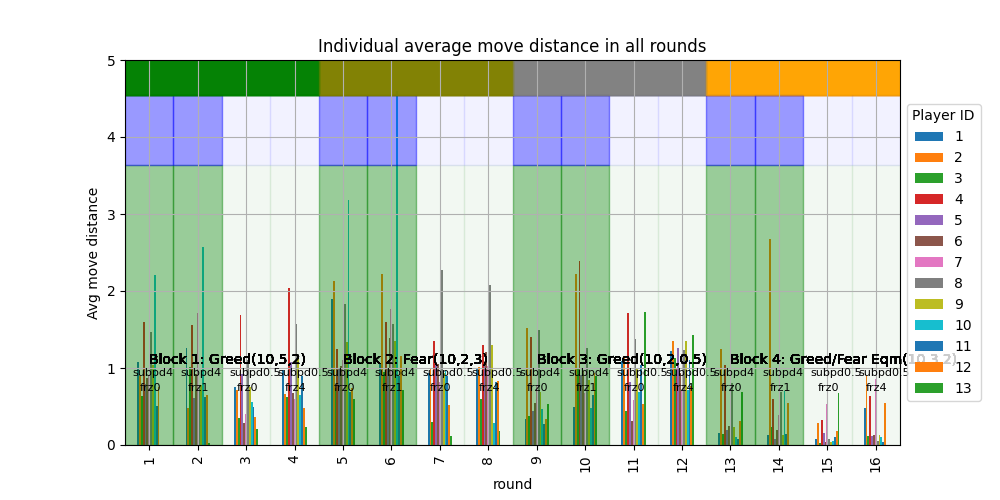

In [91]:
#not use
#absolute distance for each move
%matplotlib notebook
shade_color = ['g', 'olive', 'grey', 'orange']
freeze_period_list = [0,1,0,4,0,1,0,4,0,1,0,4,0,1,0,4]
subperiod_list = [4,4,0.5,0.5,4,4,0.5,0.5,4,4,0.5,0.5,4,4,0.5,0.5]
block_label = ['Block 1: Greed(10,5,2)', 'Block 2: Fear(10,2,3)', 'Block 3: Greed(10,2,0.5)','Block 4: Greed/Fear Eqm(10,3,2)']
df = df_copy[df_copy['session'] == 'fiy4zmu5']
practice_num = 2
df = df[df['round_number']>practice_num] #drop practice round 1 and 2
df['round_number'] = df['round_number'] - practice_num
# df = df.loc[df['seconds']>4]
df = df.loc[(df['move'] == 1)]
df = df.sort_values(by=['round_number','id_in_group', 'seconds'])
df['previous_strategies'] = df.groupby(['round_number','id_in_group'])['strategy'].shift()
df['absolute_distance'] = abs(df['previous_strategies'] - df['strategy'])
df_avg_dist = df.groupby(['round_number','id_in_group'])['absolute_distance'].mean()
df_avg_dist = df_avg_dist.reset_index()
df_avg_dist = df_avg_dist.pivot(index='round_number', columns='id_in_group', values='absolute_distance')

%matplotlib notebook
df_avg_dist.plot.bar(figsize=(10, 5))
for i in range(16):
    plt.text(i-0.2, 0.7, 'frz'+str(freeze_period_list[i]), fontsize = 8)
    plt.text(i-0.35, 0.9, 'subpd'+str(subperiod_list[i]), fontsize = 8)
    plt.axvspan(xmin=i-0.5, xmax=i+0.5, alpha=subperiod_list[i]/10, color='g', ymin=0, ymax=8/11)
    plt.axvspan(xmin=i-0.5, xmax=i+0.5, alpha=subperiod_list[i]/10, color='b', ymin=8/11, ymax=10/11)
    plt.text(0, 1.05, block_label[0], fontsize = 10)
    plt.text(4, 1.05, block_label[1], fontsize = 10)
    plt.text(8, 1.05, block_label[2], fontsize = 10)
    plt.text(12, 1.05, block_label[3], fontsize = 10)
    plt.axvspan(xmin=-0.5, xmax=3.5, alpha=0.2, color=shade_color[0], ymin=10/11, ymax=1)
    plt.axvspan(xmin=3.5, xmax=7.5, alpha=0.2, color=shade_color[1], ymin=10/11, ymax=1)
    plt.axvspan(xmin=7.5, xmax=11.5, alpha=0.2, color=shade_color[2], ymin=10/11, ymax=1)
    plt.axvspan(xmin=11.5, xmax=15.5, alpha=0.2, color=shade_color[3], ymin=10/11, ymax=1)
plt.ylim([0,5])
plt.xlabel('round')
plt.ylabel('Avg move distance')
plt.title('Individual average move distance in all rounds')
plt.grid()
plt.legend(title='Player ID', loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()
# plt.savefig('avg_dist_all.png', bbox_inches='tight')
# plt.savefig('./Experiment_data/pilot_10102023/avg_move_dist', bbox_inches='tight')

In [62]:
seconds = []
diff = []
for i in range(7,10):
    temp_df = df.loc[(df['id_in_group'] == 6)&(df['round_number'] == i)] 
    sec = temp_df['seconds'].to_numpy().tolist()
    dif = temp_df['absolute_distance'].to_numpy().tolist()
    seconds.append(sec)
    diff.append(dif)
%matplotlib notebook
plt.plot(seconds[0],diff[0])
plt.plot(seconds[1],diff[1])
plt.plot(seconds[2],diff[2])
plt.xlabel('time')
plt.ylabel('payoff')
plt.title('Round 3: Group avg payoff over time vs. NE')
plt.grid()
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


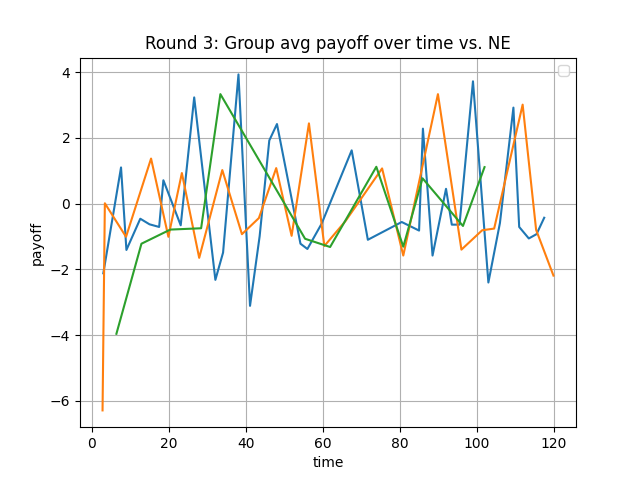

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


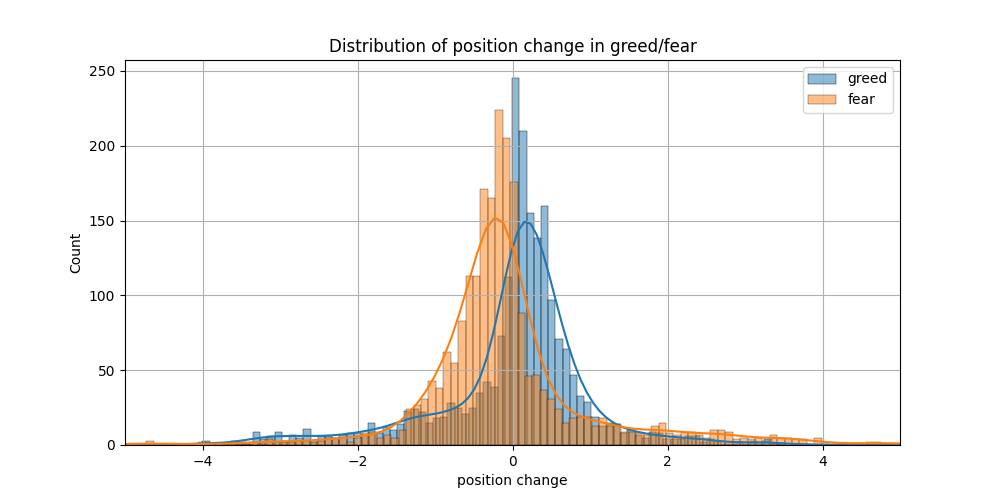

In [67]:
#sign position change distribution
df = df_copy[df_copy['strategy'] < 100]
# df = df.drop(df[(df['round_number'] < 11) & (df['id_in_group'] == 2)].index)
df = df.loc[(df['move'] == 1)]
df = df.drop(df[(df['move'] == 1) & (df['if_freeze_now'] == 1)].index)
df = df.sort_values(by=['round_number','id_in_group', 'seconds'])
df['previous_strategies'] = df.groupby(['round_number','id_in_group'])['strategy'].shift()
df['signed_distance'] = df['strategy'] - df['previous_strategies']
df_greed = df[df['round_number']<11]
df_fear = df[df['round_number']>10]

greed_mu = df_greed['signed_distance'].mean()
# greed_sigma = df_greed['signed_distance'].std()
fear_mu = df_fear['signed_distance'].mean()
# fear_sigma = df_fear['signed_distance'].std()
num_bins = 100
# print(greed_mu,greed_sigma,fear_mu, fear_sigma)
%matplotlib notebook
plt.figure(figsize=(10,5))
# sns.distplot(df_greed['signed_distance'], hist=True, kde=True, 
#              bins=num_bins, color = 'darkblue', alpha=0.3, label='greed')
# sns.distplot(df_fear['signed_distance'], hist=True, kde=True, 
#              bins=num_bins, color = 'olive', alpha=0.3, label='fear')

sns.histplot(data=df_greed['signed_distance'], kde=True, label='greed')
sns.histplot(data=df_fear['signed_distance'], kde=True, label='fear')

# greed_n, greed_bins, greed_patches = plt.hist(df_greed['signed_distance'],num_bins, alpha = 0.2,density=True, label='greed')
# fear_n, fear_bins, fear_patches = plt.hist(df_fear['signed_distance'],num_bins, alpha = 0.2,density=True, label='fear')

# y_greed = ((1 / (np.sqrt(2 * np.pi) * greed_sigma)) * np.exp(-0.5 * (1 / greed_sigma * (greed_bins - greed_mu))**2))
# y_fear = ((1 / (np.sqrt(2 * np.pi) * fear_sigma)) * np.exp(-0.5 * (1 / fear_sigma * (fear_bins - fear_mu))**2))
# # plt.hist(df_greed['signed_distance'],1000, alpha = 0.2, label='greed')
# # plt.hist(df_fear['signed_distance'],1000, alpha = 0.2, label='fear')
# plt.plot(greed_bins, y_greed, '--', color ='black')
# plt.plot(fear_bins, y_fear, '--', color ='red')
# # plt.axvline(x=0, color='red', linestyle='-',linewidth=2)
# plt.axvline(x=greed_mu, color='black', linestyle='-')
# plt.axvline(x=fear_mu, color='red', linestyle='-')
plt.xlabel('position change')
plt.xlim([-5,5])
plt.grid()
plt.legend()
plt.title('Distribution of position change in greed/fear')
plt.show()
plt.savefig('signed_position_change.png', bbox_inches='tight')


In [12]:
df = df_copy[df_copy['strategy'] < 100]
df = df.loc[(df['move'] == 1)]
df = df.sort_values(by=['round_number','id_in_group', 'seconds'])
df[df['round_number']==2]

,session,subperiod,period_length,xmax,xmin,ymax,ymin,lambda,gamma,rho,...,participant,round_number,id_in_group,seconds,strategy,payoff,multiplied_payoff,move,remaining_freeze_period,if_freeze_now
288,o98laudl,4.0,120,18.0,6.0,150.0,0.0,10.0,5.0,2.0,...,14m83rrc,2,1,4.4,9.31,102.168272,102.168272,1,1,0
297,o98laudl,4.0,120,18.0,6.0,150.0,0.0,10.0,5.0,2.0,...,14m83rrc,2,1,8.3,9.26,102.095603,102.095603,1,1,1
315,o98laudl,4.0,120,18.0,6.0,150.0,0.0,10.0,5.0,2.0,...,14m83rrc,2,1,16.3,11.68,110.449800,110.449800,1,1,0
333,o98laudl,4.0,120,18.0,6.0,150.0,0.0,10.0,5.0,2.0,...,14m83rrc,2,1,24.2,11.80,102.376444,102.376444,1,1,0
342,o98laudl,4.0,120,18.0,6.0,150.0,0.0,10.0,5.0,2.0,...,14m83rrc,2,1,28.3,11.82,99.285576,99.285576,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485,o98laudl,4.0,120,18.0,6.0,150.0,0.0,10.0,5.0,2.0,...,iitwb8xg,2,9,88.3,13.89,101.371826,101.371826,1,1,0
503,o98laudl,4.0,120,18.0,6.0,150.0,0.0,10.0,5.0,2.0,...,iitwb8xg,2,9,96.3,11.54,110.956950,110.956950,1,1,0
521,o98laudl,4.0,120,18.0,6.0,150.0,0.0,10.0,5.0,2.0,...,iitwb8xg,2,9,104.3,11.97,100.206528,100.206528,1,1,0
530,o98laudl,4.0,120,18.0,6.0,150.0,0.0,10.0,5.0,2.0,...,iitwb8xg,2,9,108.3,11.95,98.787459,98.787459,1,1,1
